In [1]:
# Detect if running in Google Colab and install huggingface_hub if needed
# import sys
# if 'google.colab' in sys.modules:
#     !pip install -q huggingface_hub
#     print("huggingface_hub installed in Google Colab environment.")
# else:
#     print("Not running in Google Colab. No installation needed.")

In [3]:
import nibabel as nib
import pandas as pd
import numpy as np
import os
import glob
import scipy.io as sio
from scipy.spatial.distance import cdist
from scipy.stats import pearsonr
import torch
from torch.utils.data import TensorDataset, DataLoader
from huggingface_hub import hf_hub_download
from fMRIVAE_Model import BetaVAE
import matplotlib.pyplot as plt
from tqdm import tqdm
import subprocess
from sklearn.metrics import silhouette_score, davies_bouldin_score, pairwise_distances, silhouette_samples
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import seaborn as sns


In [4]:
def cifti2_filename(cifti1_path, output_dir):
    basename = os.path.basename(cifti1_path)

    # List of known CIFTI suffixes
    known_suffixes = [".dtseries.nii", ".dconn.nii", ".dscalar.nii", ".dpconn.nii"]

    # Match and strip full suffix
    for suffix in known_suffixes:
        if basename.endswith(suffix):
            stem = basename[: -len(suffix)]  # strip the full suffix
            cifti2_name = f"{stem}_cifti2{suffix}"
            return os.path.join(output_dir, cifti2_name)

    raise ValueError("Unknown CIFTI suffix in filename")

In [5]:
def retrieve_filepath(dataset_folder, subj, suffix):
    """
    Retrieve the path of a file in `dataset_folder` that contains `subj` and ends with `suffix`.
    
    Parameters:
        dataset_folder (str): Path to the dataset folder.
        subj (str): Substring that must be contained in the filename.
        suffix (str): File ending (e.g., '.nii', '_bold.dtseries.nii').
    
    Returns:
        str: Full path to the matching file.
    
    Raises:
        FileNotFoundError: If no matching file is found.
        RuntimeError: If multiple matching files are found.
    """
    pattern = os.path.join(dataset_folder, f"*{subj}*{suffix}")
    matched_files = glob.glob(pattern)

    if len(matched_files) == 0:
        raise FileNotFoundError(f"No file found for subject '{subj}' ending with '{suffix}' in '{dataset_folder}'.")
    elif len(matched_files) > 1:
        raise RuntimeError(f"Multiple files found for subject '{subj}' ending with '{suffix}': {matched_files}")
    
    return matched_files[0]

In [6]:
def calc_correlations(input_file, tmask):
    if input_file.endswith(".dtseries.nii"):
        cifti_img = nib.load(input_file)
        cifti_data = cifti_img.get_fdata()
        # cifti_header = cifti_img.header
        bm_index_map = cifti_img.header.get_index_map(1)

        # Initialize storage
        vertex_indices = []
        # Loop through the brain models in the index map
        for bm in bm_index_map.brain_models:
            structure = bm.brain_structure
            if structure in ['CIFTI_STRUCTURE_CORTEX_LEFT', 'CIFTI_STRUCTURE_CORTEX_RIGHT']:
                # Convert Cifti2VertexIndices to numpy array
                offset = bm.index_offset
                count = bm.index_count
                vertex_indices.extend(range(offset, offset + count))

        vertex_indices = np.array(vertex_indices)
        cortex_ts = np.transpose(cifti_data[:, vertex_indices])
        masked_cortex_ts = cortex_ts[:, tmask]
        corr_matrix = np.corrcoef(masked_cortex_ts)
        return corr_matrix
    else:
        raise ValueError("Input file must be a CIFTI-2 time-series file. ")

In [7]:
def calc_parcel_vertex_correlations(dtseries_file, ptseries_file, tmask, parcellation):
    """
    Calculates the correlation between parcellated time series (e.g., 333 regions)
    and vertex-level time series across the cortex from a CIFTI dtseries file.

    This function:
    - Loads a .ptseries.nii file (parcellated time series) and reorders it using a parcellation struct
    - Filters out networks labeled "None" or "USp"
    - Applies a temporal mask (tmask) to remove motion-contaminated frames
    - Loads a .dtseries.nii file (vertex-level BOLD time series)
    - Extracts cortical vertex data from left and right hemispheres
    - Computes Pearson correlation between each parcel and each vertex
    - Returns a matrix of shape (num_parcels_retained, num_cortical_vertices)

    Parameters
    ----------
    dtseries_file : str
        Path to the CIFTI-2 .dtseries.nii file (e.g., fsLR surface BOLD time series).
    
    ptseries_file : str
        Path to the CIFTI-2 .ptseries.nii file containing parcellated time series.
    
    tmask : ndarray of shape (timepoints,)
        Boolean array indicating timepoints to keep (True = retain).
    
    parcellation : dict
        Dictionary loaded from a MATLAB .mat file, containing keys:
        - 'order': ordering of parcel columns
        - 'key': mapping between parcels and network labels
        - 'Nets': array of network name strings
        - 'cMap': colormap used for visualization (not used here)
    
    Returns
    -------
    parcel_vertex_corr_matrix : ndarray of shape (num_parcels_retained, num_cortical_vertices)
        Pearson correlation matrix between each retained parcel and each cortical vertex.
    
    Raises
    ------
    ValueError
        If zero or multiple "None"/"USp" network labels are found in the parcellation.
    
    Notes
    -----
    - Assumes that the .ptseries and .dtseries are aligned in time and space.
    - No normalization is applied to the BOLD signals before correlation (only mean-centering).
    - Uses np.corrcoef to efficiently compute the full correlation matrix.
    """

    # --- Check file types
    assert dtseries_file.endswith(".dtseries.nii")
    assert ptseries_file.endswith("ptseries.nii")

    # --- Load parcellated time series
    ptseries_img = nib.load(ptseries_file)
    ptseries_data = ptseries_img.get_fdata()

    # --- Load parcellation metadata
    parcel_order = parcellation["order"][0, 0].flatten() - 1 # make it Python-style (starts from 0)
    parcel_keys = parcellation["key"][0, 0]
    net_names = parcellation["Nets"][0, 0].flatten()
    net_colors = parcellation["cMap"][0, 0]

    # --- Identify index to exclude: "None" or "USp"
    none_idx = [i+1 for i, val in enumerate(net_names) if val.item() in ["None", "USp"]]
    # Ensure only one match
    if len(none_idx) != 1:
        raise ValueError(f"Expected exactly one match for 'None' or 'USp', but found: {len(none_idx)}")
    none_idx = none_idx[0]
    keepnets = parcel_keys[:, 1] != none_idx

    ptseries_ordered = ptseries_data[:, parcel_order]
    ptseries_ordered = ptseries_ordered[:, keepnets]
    ptseries_masked = np.transpose(ptseries_ordered[tmask])

    dtseries_img = nib.load(dtseries_file)
    dtseries_data = dtseries_img.get_fdata()
    bm_index_map = dtseries_img.header.get_index_map(1)

    # --- Extract all cortical vertex indices
    vertex_indices = []
    # Loop through the brain models in the index map
    for bm in bm_index_map.brain_models:
        structure = bm.brain_structure
        if structure in ['CIFTI_STRUCTURE_CORTEX_LEFT', 'CIFTI_STRUCTURE_CORTEX_RIGHT']:
            # Convert Cifti2VertexIndices to numpy array
            offset = bm.index_offset
            count = bm.index_count
            vertex_indices.extend(range(offset, offset + count))

    vertex_indices = np.array(vertex_indices)
    cortex_dtseries = np.transpose(dtseries_data[:, vertex_indices])
    masked_cortex_dtseries = cortex_dtseries[:, tmask]

    # --- Compute parcel–vertex correlation matrix using np.corrcoef
    full_corr_matrix = np.corrcoef(np.vstack([ptseries_masked, masked_cortex_dtseries]))
    num_parcels = ptseries_masked.shape[0]
    parcel_vertex_corr_matrix = full_corr_matrix[:num_parcels, num_parcels:]
    return parcel_vertex_corr_matrix

In [8]:
# def forward_reformatting(corrs, transmat_path, img_size):
#     # assert corrs.shape == (59412, )
#     left_data, right_data = corrs[:29696, :], corrs[29696:, :]
#     left_mask = sio.loadmat(os.path.join(transmat_path, "Left_fMRI2Grid_192_by_192_NN.mat"))
#     right_mask = sio.loadmat(os.path.join(transmat_path, "Right_fMRI2Grid_192_by_192_NN.mat"))
#     left_transmat = left_mask['grid_mapping']
#     right_transmat = right_mask['grid_mapping']
    
#     left_surf_data = np.reshape(left_transmat @ left_data, (img_size, img_size, 1, -1), order='F')
#     left_surf_data = np.transpose(left_surf_data, axes=(3, 2, 0, 1)) # (batch, 1, height_width)
#     right_surf_data = np.reshape(right_transmat @ right_data, (img_size, img_size, 1, -1), order='F')
#     right_surf_data = np.transpose(right_surf_data, axes=(3, 2, 0, 1))

#     return left_surf_data, right_surf_data

def forward_reformatting(corrs, transmat_path, img_size):
    """
    Projects vertex-level data onto 2D cortical grids for left and right hemispheres.

    This function:
    - Splits vertex-level fMRI data into left and right hemispheres
    - Applies hemisphere-specific transformation matrices (e.g., fMRI-to-grid)
    - Reshapes the resulting 2D projection into image format for model input

    Parameters
    ----------
    corrs : ndarray of shape (num_samples, num_features)
        Vertex-level input data (e.g., correlation values or BOLD signals).
        Assumes num_features = 59412 (29696 left + 29716 right cortical vertices).
    
    transmat_path : str
        Directory path containing 'Left_fMRI2Grid_192_by_192_NN.mat' and 
        'Right_fMRI2Grid_192_by_192_NN.mat', each with a 'grid_mapping' matrix.
    
    img_size : int
        The side length of the 2D grid (e.g., 192 for a 192×192 projection).
    
    Returns
    -------
    left_surf_data : ndarray of shape (num_samples, 1, img_size, img_size)
        2D grid representation of left hemisphere data.
    
    right_surf_data : ndarray of shape (num_samples, 1, img_size, img_size)
        2D grid representation of right hemisphere data.

    Notes
    -----
    - The transformation matrices are assumed to be of shape (img_size*img_size, num_vertices).
    - Data is reshaped using column-major (Fortran-style) ordering to match MATLAB-style layouts.
    - Output is formatted in NCHW format for input to deep learning models (e.g., CNNs).
    """
    num_samples, num_vertices = corrs.shape
    assert num_vertices == 59412, "Expected 59412 cortical vertices (29696 left + 29716 right)."

    # Split input features into left and right hemispheres
    left_data = corrs[:, :29696]   # shape: (num_samples, 29696)
    right_data = corrs[:, 29696:]  # shape: (num_samples, 29716)

    # Load transformation matrices
    left_transmat = sio.loadmat(os.path.join(transmat_path, "Left_fMRI2Grid_192_by_192_NN.mat"))['grid_mapping']
    right_transmat = sio.loadmat(os.path.join(transmat_path, "Right_fMRI2Grid_192_by_192_NN.mat"))['grid_mapping']

    # Project data onto 2D grid
    left_proj = left_data @ left_transmat.T    # shape: (num_samples, img_size * img_size)
    right_proj = right_data @ right_transmat.T # shape: (num_samples, img_size * img_size)

    # Reshape to (num_samples, 1, img_size, img_size) using column-major (Fortran-style) order
    # left_surf_data = np.reshape(left_proj, (num_samples, 1, img_size, img_size), order='F')
    # right_surf_data = np.reshape(right_proj, (num_samples, 1, img_size, img_size), order='F')
    left_surf_data = np.reshape(left_proj, (num_samples, 1, img_size, img_size))
    right_surf_data = np.reshape(right_proj, (num_samples, 1, img_size, img_size))

    return left_surf_data, right_surf_data

In [9]:
def backword_reformatting(left_surf_recon, right_surf_recon, transmat_path):
    assert left_surf_recon.shape == right_surf_recon.shape
    batch_size = left_surf_recon.shape[0]
    left_mask = sio.loadmat(os.path.join(transmat_path, "Left_fMRI2Grid_192_by_192_NN.mat"))
    right_mask = sio.loadmat(os.path.join(transmat_path, "Right_fMRI2Grid_192_by_192_NN.mat"))
    left_transmat_backward = left_mask['inverse_transformation']
    right_transmat_backward = right_mask['inverse_transformation']

    left_corrs = left_transmat_backward @ left_surf_recon.reshape(batch_size, -1).T
    right_corrs = right_transmat_backward @ right_surf_recon.reshape(batch_size, -1).T
    dtseries_recon = np.vstack((left_corrs, right_corrs))
    dtseries_recon[dtseries_recon == 0] = 1
    return dtseries_recon

In [10]:
# def rand_sample(left_surf_data, right_surf_data, sample_ratio=1.0):
#     assert left_surf_data.shape == right_surf_data.shape
#     if sample_ratio <= 0 or sample_ratio > 1.0:
#         raise ValueError("Please pick a sample ratio between 0 and 1. ")
#     # print(left_surf_data.shape)
#     sample_size, _, _, img_size = left_surf_data.shape
#     indices = np.random.choice(sample_size, int(sample_size*sample_ratio), replace=False)
#     sampled_left_surf_data = left_surf_data[indices, :, :, :]
#     sampled_right_surf_data  = right_surf_data[indices, :, :, :]
#     return sampled_left_surf_data, sampled_right_surf_data

def rand_sample(corrs, sample_ratio=1.0):
    if sample_ratio <= 0 or sample_ratio > 1.0:
        raise ValueError("Please pick a sample ratio between 0 and 1. ")
    # print(left_surf_data.shape)
    sample_size = corrs.shape[1]
    indices = np.random.choice(sample_size, int(sample_size*sample_ratio), replace=False)
    sampled_corrs = corrs[:, indices]
    return sampled_corrs

In [11]:
def load_model(zdim, nc, device):
    repo_id = "cindyhfls/fcMRI-VAE"
    if zdim == 2:
        filename = "Checkpoint/checkpoint49_2024-03-28_Zdim_2_Vae-beta_20.0_Lr_0.0001_Batch-size_128_washu120_subsample10_train100_val10.pth.tar"
    elif zdim == 3:
        filename = "Checkpoint/checkpoint49_2024-11-28_Zdim_3_Vae-beta_20.0_Lr_0.0001_Batch-size_128_washu120_subsample10_train100_val10.pth.tar"
    elif zdim == 4:
        filename = "Checkpoint/checkpoint49_2024-06-21_Zdim_4_Vae-beta_20.0_Lr_0.0001_Batch-size_128_washu120_subsample10_train100_val10.pth.tar"
    else:
        raise ValueError("Invalid latent dimension. Please choose among 2, 3 and 4. ")
    
    checkpoint_path = hf_hub_download(repo_id=repo_id, filename=filename)
    # Load checkpoint into memory
    checkpoint = torch.load(checkpoint_path, map_location="cpu")
    model = BetaVAE(z_dim=zdim, nc=nc)
    model.load_state_dict(checkpoint['state_dict'])
    model.eval()
    return model.to(device)

In [12]:
def model_inference(left_surf_data, right_surf_data, zdim, nc, mode, batch_size, device):
    """
    Run inference on left and right surface data using a VAE model.

    Parameters:
        left_surf_data (np.ndarray or torch.Tensor): Input tensor of shape (batch, C, H, W)
        right_surf_data (np.ndarray or torch.Tensor): Same shape as left_surf_data
        zdim (int): Dimensionality of latent space
        nc (int): Number of input channels
        mode (str): "encode" for latent output, "both" for latent and reconstruction
        batch_size (int): Inference batch size
        device (torch.device): Target device for model and data

    Returns:
        If mode == "encode":
            z_distributions: np.ndarray of shape (N, 2*zdim)
        If mode == "both":
            Tuple of:
                z_distributions: np.ndarray of shape (N, 2*zdim)
                xL_recon: np.ndarray of shape (N, C, H, W)
                xR_recon: np.ndarray of shape (N, C, H, W)
    """

    def generate_loader(left_surf_data, right_surf_data, batch_size):
        if isinstance(left_surf_data, np.ndarray):
            left_surf_data = torch.tensor(left_surf_data, dtype=torch.float32)
        if isinstance(right_surf_data, np.ndarray):
            right_surf_data = torch.tensor(right_surf_data, dtype=torch.float32)

        # Create a TensorDataset
        dataset = TensorDataset(left_surf_data, right_surf_data)
        # Return a DataLoader
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
        return loader

    model = load_model(zdim, nc, device=device)
    model.eval()
    inference_loader = generate_loader(left_surf_data, right_surf_data, batch_size)

    all_z_distributions = []
    all_xL_recon = []
    all_xR_recon = []

    with torch.no_grad():
        for batch_idx, (xL, xR) in enumerate(inference_loader):
            xL = xL.to(device)
            xR = xR.to(device)
            # print(xL.shape)
            z_distribution = model._encode(xL, xR)
            all_z_distributions.append(z_distribution.cpu().numpy())

            if mode == "both":
                mu = z_distribution[:, :zdim]
                # z = torch.tensor(mu).to(device)
                z = mu.clone().detach().to(device)
                xL_recon, xR_recon = model._decode(z)
                all_xL_recon.append(xL_recon.cpu().numpy())
                all_xR_recon.append(xR_recon.cpu().numpy())
    
    all_z_distributions = np.concatenate(all_z_distributions, axis=0)

    if mode == "encode":
        return all_z_distributions
    elif mode == "both":
        all_xL_recon = np.concatenate(all_xL_recon, axis=0)
        all_xR_recon = np.concatenate(all_xR_recon, axis=0)
        return all_z_distributions, all_xL_recon, all_xR_recon
    else:
        raise ValueError("Invalid mode. Choose 'encode' or 'both'.")

In [13]:
def calc_etasquared(a, b):
    """
    Calculate eta squared based on Cohen 2008 Neuroimage.
    
    Parameters:
    a : np.ndarray
        First input array.
    b : np.ndarray
        Second input array.
    
    Returns:
    etasquared : np.ndarray
        Array of eta squared values.
    """

    # Ensure inputs are at least 2D
    if a.ndim == 1:
        a = a[:, np.newaxis]
    if b.ndim == 1:
        b = b[:, np.newaxis]

    assert a.shape[0] == b.shape[0], 'input size mismatch'

    cols_a = a.shape[1]
    cols_b = b.shape[1]
    etasquared = np.full((cols_b, cols_a), np.nan)

    for ia in range(cols_a):
        for ib in range(cols_b):
            aa = a[:, ia]
            bb = b[:, ib]

            m = (aa + bb) / 2
            Mbar = np.nanmean(m)
            
            SSwithin = np.nansum((aa - m) ** 2 + (bb - m) ** 2)
            SStotal = np.nansum((aa - Mbar) ** 2 + (bb - Mbar) ** 2)
            etasquared[ib, ia] = 1 - SSwithin / SStotal

    return etasquared

In [14]:
def visualize_representations(mus, labels, net_names, net_colors, s=5, alpha=0.8):
    """
    Visualizes 2D representations of samples with network-based color coding.

    Parameters
    ----------
    zs : ndarray of shape (num_samples, 2)
        The 2D embedding or latent representation of each sample.
    
    labels : ndarray of shape (num_samples,)
        Integer labels corresponding to each sample, ranging from 0 to 12,
        with label 6 ("None") already removed.
    
    net_names : ndarray of shape (13,)
        Array of network names, where each element is a 1-element array of strings.
    
    net_colors : ndarray of shape (13, 3)
        RGB color for each network (values in 0–255 or 0–1 depending on format).

    Returns
    -------
    None
        Displays a scatter plot of the 2D representations.
    
    Notes
    -----
    - Assumes label 6 ("None") has already been filtered from the data.
    - Ensures "None" is also excluded from the legend.
    """
    # Normalize colors if in 0–255 range
    if net_colors.max() > 1:
        colors = net_colors / 255.0
    else:
        colors = net_colors

    plt.figure(figsize=(10, 8))

    unique_labels = np.unique(labels)
    for label in unique_labels:
        name = net_names[label].item()
        if name == "None" or name == "USp":
            continue  # Skip "None" or "USp" in legend
        mask = labels == label
        plt.scatter(mus[mask, 0], mus[mask, 1],
                    label=name,
                    color=colors[label],
                    s=s, alpha=alpha, edgecolors='none')

    plt.title("2D Representation of Brain Networks")
    plt.xlabel("Latent Dimension 1")
    plt.ylabel("Latent Dimension 2")
    plt.legend(loc='best', fontsize=9, frameon=True)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

In [15]:
def visualize_representations_subplots(mus, labels, net_names, net_colors, s=5, alpha=0.8):
    """
    Visualizes 2D representations as separate subplots for each network class,
    using consistent global axis limits.

    Parameters
    ----------
    mus : ndarray of shape (num_samples, 2)
        The 2D embedding or latent representation of each sample.
    
    labels : ndarray of shape (num_samples,)
        Integer labels corresponding to each sample, ranging from 0 to 12,
        with label 6 ("None") already removed.
    
    net_names : ndarray of shape (13,)
        Array of network names, where each element is a 1-element array of strings.
    
    net_colors : ndarray of shape (13, 3)
        RGB color for each network (values in 0–255 or 0–1 depending on format).

    Returns
    -------
    None
        Displays a grid of scatter subplots.
    """
    # Normalize colors if needed
    if net_colors.max() > 1:
        colors = net_colors / 255.0
    else:
        colors = net_colors

    unique_labels = [label for label in np.unique(labels)
                     if net_names[label].item() not in ["None", "USp"]]
    
    num_classes = len(unique_labels)
    cols = 3
    rows = int(np.ceil(num_classes / cols))

    # Compute global axis limits
    x_min, x_max = mus[:, 0].min(), mus[:, 0].max()
    y_min, y_max = mus[:, 1].min(), mus[:, 1].max()

    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows), squeeze=False)

    for idx, label in enumerate(unique_labels):
        row, col = divmod(idx, cols)
        ax = axes[row][col]
        
        mask = labels == label
        ax.scatter(mus[mask, 0], mus[mask, 1],
                   color=colors[label],
                   s=s, alpha=alpha, edgecolors='none')
        
        ax.set_title(net_names[label].item(), fontsize=10)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(True, linestyle='--', alpha=0.2)

    # Hide any unused subplots
    for idx in range(num_classes, rows * cols):
        row, col = divmod(idx, cols)
        axes[row][col].axis('off')

    fig.suptitle("2D Representations by Network Class", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [16]:
# def visualize_representations_comparison(mus_list, labels_list, titles, net_names, net_colors, s=5, alpha=0.8):
#     """
#     Visualizes two 2D representations side-by-side using the same axis limits.

#     Parameters
#     ----------
#     mus_list : list of two ndarrays (each of shape (n_samples, 2))
#         List of 2D embeddings for two datasets.

#     labels_list : list of two ndarrays
#         Corresponding labels for the two datasets.

#     titles : list of str
#         Titles for the two subplots.

#     net_names : ndarray
#         Array of network names (13,), where each is a 1-element string array.

#     net_colors : ndarray
#         Array of RGB colors (13, 3) for each network.

#     s : int
#         Size of scatter points.

#     alpha : float
#         Transparency of scatter points.
#     """
#     if net_colors.max() > 1:
#         colors = net_colors / 255.0
#     else:
#         colors = net_colors

#     fig, axes = plt.subplots(1, 2, figsize=(16, 7), sharex=True, sharey=True)

#     # Determine global axis limits
#     all_data = np.vstack(mus_list)
#     xlim = [np.min(all_data[:, 0]) - 1, np.max(all_data[:, 0]) + 1]
#     ylim = [np.min(all_data[:, 1]) - 1, np.max(all_data[:, 1]) + 1]

#     for ax, mus, labels, title in zip(axes, mus_list, labels_list, titles):
#         unique_labels = np.unique(labels)
#         for label in unique_labels:
#             name = net_names[label].item()
#             if name in ["None", "USp"]:
#                 continue
#             mask = labels == label
#             ax.scatter(mus[mask, 0], mus[mask, 1],
#                        label=name,
#                        color=colors[label],
#                        s=s, alpha=alpha, edgecolors='none')
#         ax.set_title(title)
#         ax.set_xlim(xlim)
#         ax.set_ylim(ylim)
#         ax.set_xlabel("Latent Dimension 1")
#         ax.set_ylabel("Latent Dimension 2")
#         ax.grid(True, linestyle='--', alpha=0.3)

#     axes[1].legend(loc='best', fontsize=9, frameon=True)
#     plt.tight_layout()
#     plt.show()


## Single-subject inference

In [17]:
example_cifti_cohort_filepath = "./data/cohort_files/cohortfiles_washu120.txt"
example_tmask_cohort_filepath = "./data/tmask_files/tmasklist_washu120.txt"
ptseries_folder = "/data/wheelock/data1/datasets/WashU120/ptseries/Gordon/"
dtseries_folder = "./data/washu120/"

cifti_cohort_df = pd.read_csv(example_cifti_cohort_filepath, delim_whitespace=True, header=None)
tmask_cohort_df = pd.read_csv(example_tmask_cohort_filepath, delim_whitespace=True, header=None)

example_idx = 111
subj, cifti1_path = cifti_cohort_df.iloc[example_idx, :2].tolist()
tmask_subj, tmask_path = tmask_cohort_df.iloc[example_idx, :].tolist()

assert subj == tmask_subj
tmask = np.loadtxt(tmask_path, dtype=int).astype(bool)

# dtseries_path = cifti2_filename(cifti1_path, dataset_folder)
dtseries_path = retrieve_filepath(dtseries_folder, subj, "dtseries.nii")
ptseries_path = retrieve_filepath(ptseries_folder, subj, "ptseries.nii")
transmat_path = "./mask"
parcellation_filename = "IM_Gordon_13nets_333Parcels.mat"
parcellation_path = os.path.join(transmat_path, parcellation_filename)

In [18]:
ptseries_img = nib.load(ptseries_path)
ptseries_data = ptseries_img.get_fdata()
parcellation = sio.loadmat(os.path.join(transmat_path, parcellation_filename))["IM"]
# print(parcellation)
parcel_order = parcellation["order"][0, 0].flatten() - 1 # make it Python-style (starts from 0)
parcel_keys = parcellation["key"][0, 0]
net_names = parcellation["Nets"][0, 0].flatten()
# print(net_names)
net_colors = parcellation["cMap"][0, 0]
none_idx = [i+1 for i, val in enumerate(net_names) if val.item() in ["None", "USp"]]
# Ensure only one match
if len(none_idx) != 1:
    raise ValueError(f"Expected exactly one match for 'None' or 'USp', but found: {len(none_idx)}")
none_idx = none_idx[0]
keepnets = parcel_keys[:, 1] != none_idx

# print(parcel_order.shape)
# print(parcel_keys.shape)
# print(net_names.shape)
# print(net_colors.shape)
# print(ptseries_data.shape)
# print(parcel_keys)
# print(tmask.shape)
# print(none_idx)
# print(keepnets)

(286, 286)


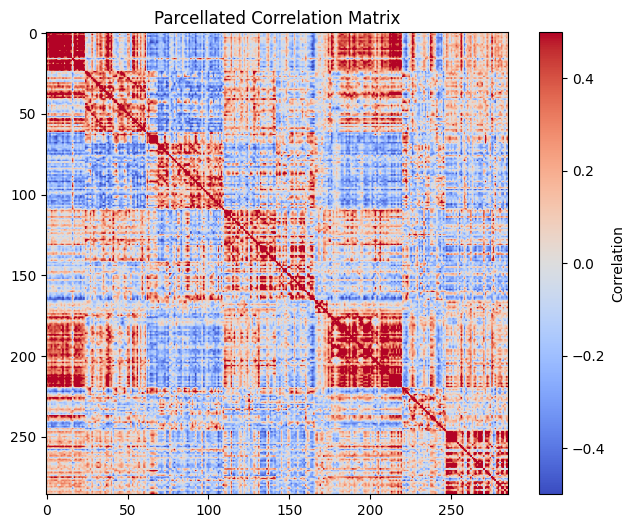

In [19]:
ptseries_ordered = ptseries_data[:, parcel_order]
ptseries_ordered = ptseries_ordered[:, keepnets]
ptseries_masked = np.transpose(ptseries_ordered[tmask])

corrs_parcel = np.corrcoef(ptseries_masked)
print(corrs_parcel.shape)

plt.figure(figsize=(8, 6))
plt.imshow(corrs_parcel, cmap='coolwarm', vmin=-0.5, vmax=0.5)
plt.colorbar(label='Correlation')
plt.title('Parcellated Correlation Matrix')
plt.show()

In [20]:
# dtseries_img = nib.load(dtseries_path)
# dtseries_data = dtseries_img.get_fdata()
# bm_index_map = dtseries_img.header.get_index_map(1)

# # Initialize storage
# vertex_indices = []
# # Loop through the brain models in the index map
# for bm in bm_index_map.brain_models:
#     structure = bm.brain_structure
#     if structure in ['CIFTI_STRUCTURE_CORTEX_LEFT', 'CIFTI_STRUCTURE_CORTEX_RIGHT']:
#         # Convert Cifti2VertexIndices to numpy array
#         offset = bm.index_offset
#         count = bm.index_count
#         vertex_indices.extend(range(offset, offset + count))

# vertex_indices = np.array(vertex_indices)
# cortex_dtseries = np.transpose(dtseries_data[:, vertex_indices])
# masked_cortex_dtseries = cortex_dtseries[:, tmask]

# print(masked_cortex_dtseries.shape)

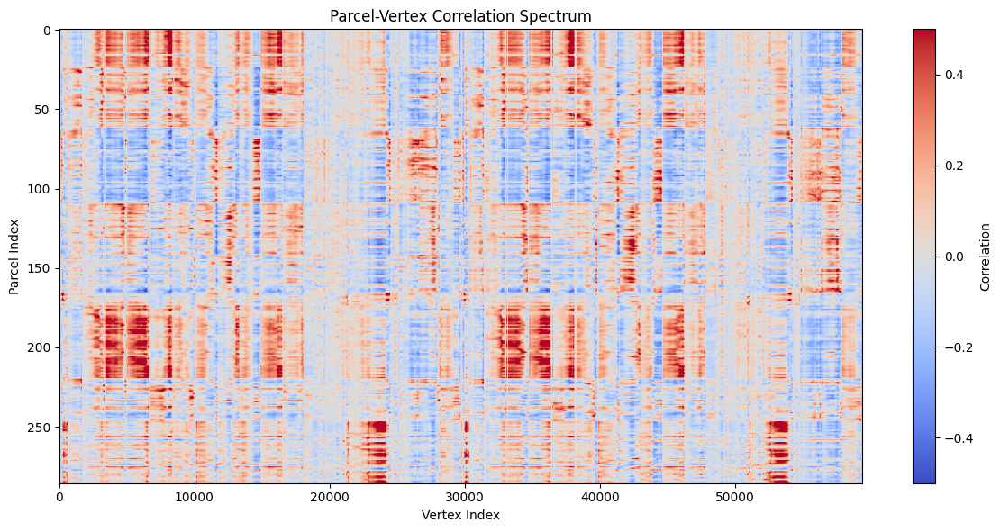

In [21]:
# full_corr_matrix = np.corrcoef(np.vstack([ptseries_masked, masked_cortex_dtseries]))
# num_parcels = ptseries_masked.shape[0]
# parcel_vertex_corr_matrix = full_corr_matrix[:num_parcels, num_parcels:]

# print(parcel_vertex_corr_matrix.shape)

parcel_vertex_corr_matrix = calc_parcel_vertex_correlations(dtseries_path, ptseries_path, tmask, parcellation)

plt.figure(figsize=(12, 6))
plt.imshow(parcel_vertex_corr_matrix, aspect='auto', cmap='coolwarm', vmin=-0.5, vmax=0.5)
plt.colorbar(label='Correlation')
plt.xlabel('Vertex Index')
plt.ylabel('Parcel Index')
plt.title('Parcel-Vertex Correlation Spectrum')
plt.tight_layout()
plt.show()

In [22]:
# left_mask_struct = sio.loadmat(os.path.join(transmat_path, "Left_fMRI2Grid_192_by_192_NN.mat"))
# left_mask = left_mask_struct['grid_mapping']
# right_mask_struct = sio.loadmat(os.path.join(transmat_path, "Right_fMRI2Grid_192_by_192_NN.mat"))
# right_mask = right_mask_struct['grid_mapping']
# print(left_mask.shape)
# print(right_mask.shape)
# mask = sio.loadmat(os.path.join(transmat_path, "MSE_Mask.mat"))

In [23]:
# for test
# corrs = calc_correlations(input_file=dtseries_path, tmask=tmask)
# corrs = rand_sample(corrs, sample_ratio=0.1)
# left_surf_data, right_surf_data = forward_reformatting(corrs, transmat_path, img_size=192)
# print(left_surf_data.shape)
# print(right_surf_data.shape)
print(parcel_vertex_corr_matrix.shape)
left_surf_data, right_surf_data = forward_reformatting(parcel_vertex_corr_matrix, transmat_path, img_size=192)
print(left_surf_data.shape)

(286, 59412)
(286, 1, 192, 192)


In [24]:
model = load_model(zdim=2, nc=1, device="cpu")
zs, left_surf_recon, right_surf_recon = model_inference(left_surf_data, right_surf_data, zdim=2, nc=1, mode="both", batch_size=16, device="cpu")
mus = zs[:, :2]

print(mus.shape)
print(left_surf_recon.shape)
print(right_surf_recon.shape)

(286, 2)
(286, 1, 192, 192)
(286, 1, 192, 192)


In [25]:
parcel_labels = parcel_keys[keepnets, 1].flatten() - 1
print(net_names)

[array(['Aud'], dtype='<U3') array(['CON'], dtype='<U3')
 array(['PMN'], dtype='<U3') array(['DMN'], dtype='<U3')
 array(['DAN'], dtype='<U3') array(['FPN'], dtype='<U3')
 array(['None'], dtype='<U4') array(['RTN'], dtype='<U3')
 array(['SMN hand'], dtype='<U8') array(['SMN mouth'], dtype='<U9')
 array(['Sal'], dtype='<U3') array(['VAN'], dtype='<U3')
 array(['Vis'], dtype='<U3')]


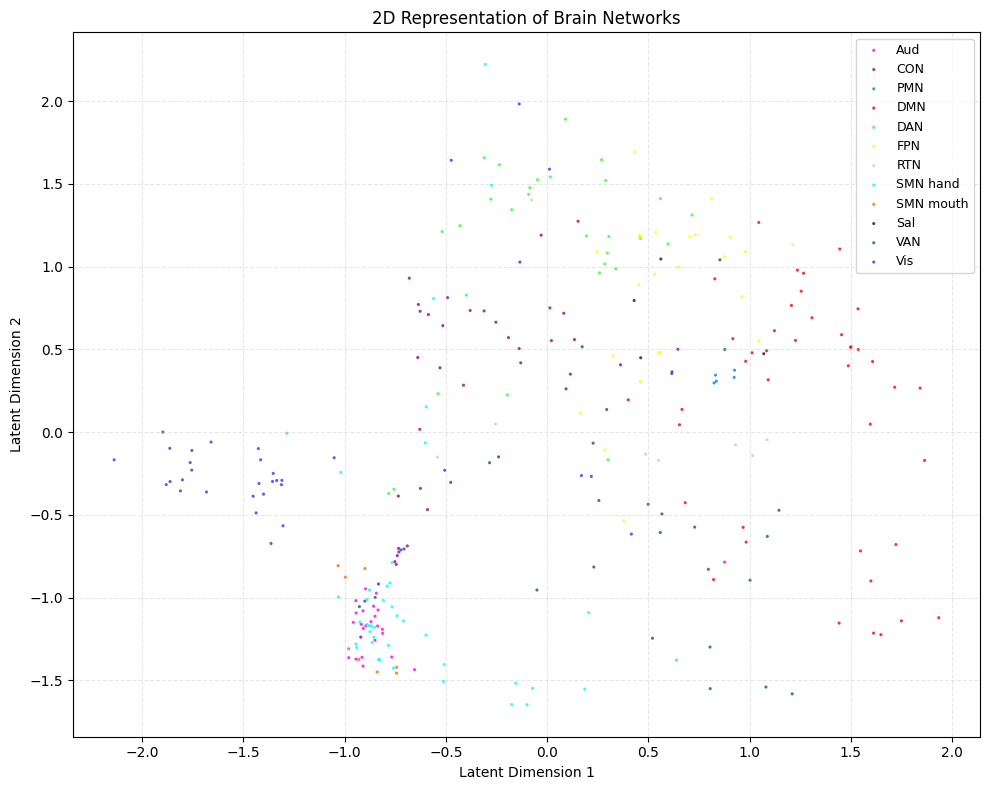

In [26]:
visualize_representations(mus, parcel_labels, net_names, net_colors)

## WU120 inference

In [26]:
# Setup
parcellation_path = os.path.join("./mask", "IM_Gordon_13nets_333Parcels.mat")
transmat_path = "./mask"
parcellation_filename = "IM_Gordon_13nets_333Parcels.mat"
parcellation = sio.loadmat(os.path.join(transmat_path, parcellation_filename))["IM"]
# parcel_order = parcellation["order"][0, 0].flatten() - 1 # make it Python-style (starts from 0)
parcel_keys = parcellation["key"][0, 0]
net_names = parcellation["Nets"][0, 0].flatten()
net_colors = parcellation["cMap"][0, 0]
none_idx = [i+1 for i, val in enumerate(net_names) if val.item() in ["None", "USp"]]
# Ensure only one match
if len(none_idx) != 1:
    raise ValueError(f"Expected exactly one match for 'None' or 'USp', but found: {len(none_idx)}")
none_idx = none_idx[0]
keepnets = parcel_keys[:, 1] != none_idx
parcel_labels = parcel_keys[keepnets, 1].flatten() - 1
print(parcel_labels.shape)

(286,)


In [144]:
# Load cohort file paths
cifti_df = pd.read_csv("./data/cohort_files/cohortfiles_washu120.txt", delim_whitespace=True, header=None)
tmask_df = pd.read_csv("./data/tmask_files/tmasklist_washu120.txt", delim_whitespace=True, header=None)

ptseries_folder = "/data/wheelock/data1/datasets/WashU120/ptseries/Gordon/"
dtseries_folder = "./data/washu120/"
os.makedirs(dtseries_folder, exist_ok=True)

model = load_model(zdim=2, nc=1, device="cpu")
mus_all, labels_all, subj_indices = [], [], []

# Loop with progress bar
for idx, row in tqdm(cifti_df.iterrows(), total=len(cifti_df), desc="Processing subjects"):
    subj, original_dtseries_path = row.iloc[0], row.iloc[1]
    tmask_subj, tmask_path = tmask_df.iloc[idx]
    assert tmask_subj == subj

    # Determine converted dtseries path
    dtseries_filename = os.path.basename(original_dtseries_path)
    converted_dtseries_path = os.path.join(dtseries_folder, dtseries_filename)

    # Convert CIFTI-1 to CIFTI-2 if not already converted
    if not os.path.exists(converted_dtseries_path):
        cmd = [
            "wb_command",
            "-file-convert",
            "-cifti-version-convert",
            original_dtseries_path,
            "2",
            converted_dtseries_path
        ]
        subprocess.run(cmd, check=True)

    ptseries_path = retrieve_filepath(ptseries_folder, subj, suffix=".ptseries.nii")
    tmask = np.loadtxt(tmask_path, dtype=int).astype(bool)

    parcel_vertex_corr = calc_parcel_vertex_correlations(converted_dtseries_path, ptseries_path, tmask, parcellation)
    l_surf, r_surf = forward_reformatting(parcel_vertex_corr, "./mask", img_size=192)

    zs, _, _ = model_inference(l_surf, r_surf, zdim=2, nc=1, mode="both", batch_size=16, device="cpu")
    mus_all.append(zs[:, :2])
    labels_all.append(parcel_labels)
    subj_indices.append(np.full(parcel_vertex_corr.shape[0], idx))

# Combine all subject data
mus_all = np.concatenate(mus_all)
labels_all = np.concatenate(labels_all)
subj_indices = np.concatenate(subj_indices)
    

Processing subjects:   1%|          | 1/120 [00:37<1:15:08, 37.88s/it]


KeyboardInterrupt: 

In [ ]:
np.savez_compressed("./data/inference_results/washu120.npz",
                    mus=mus_all,
                    labels=labels_all,
                    subj_indices=subj_indices)

NameError: name 'mus_all' is not defined

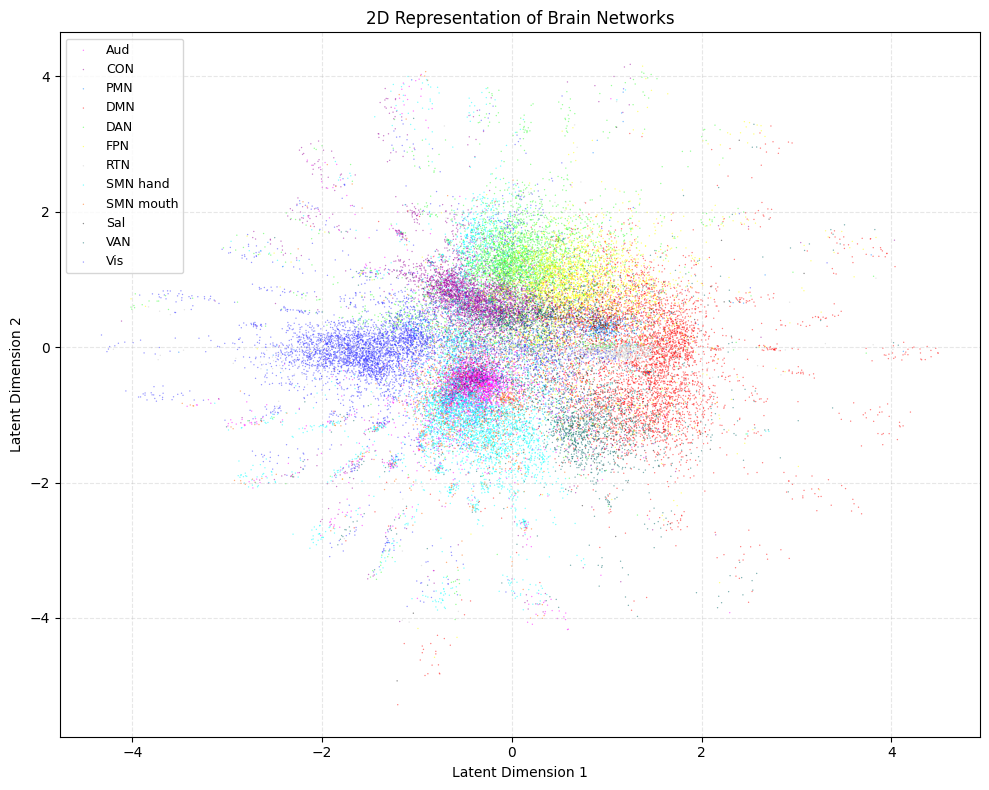

In [27]:
inference_results_washu120 = np.load("./data/inference_results/washu120.npz")
mus_washu120 = inference_results_washu120["mus"]
labels_washu120 = inference_results_washu120["labels"]
subj_indices_washu120 = inference_results_washu120["subj_indices"]

visualize_representations(mus_washu120, labels_washu120, net_names, net_colors, s=1, alpha=0.5)

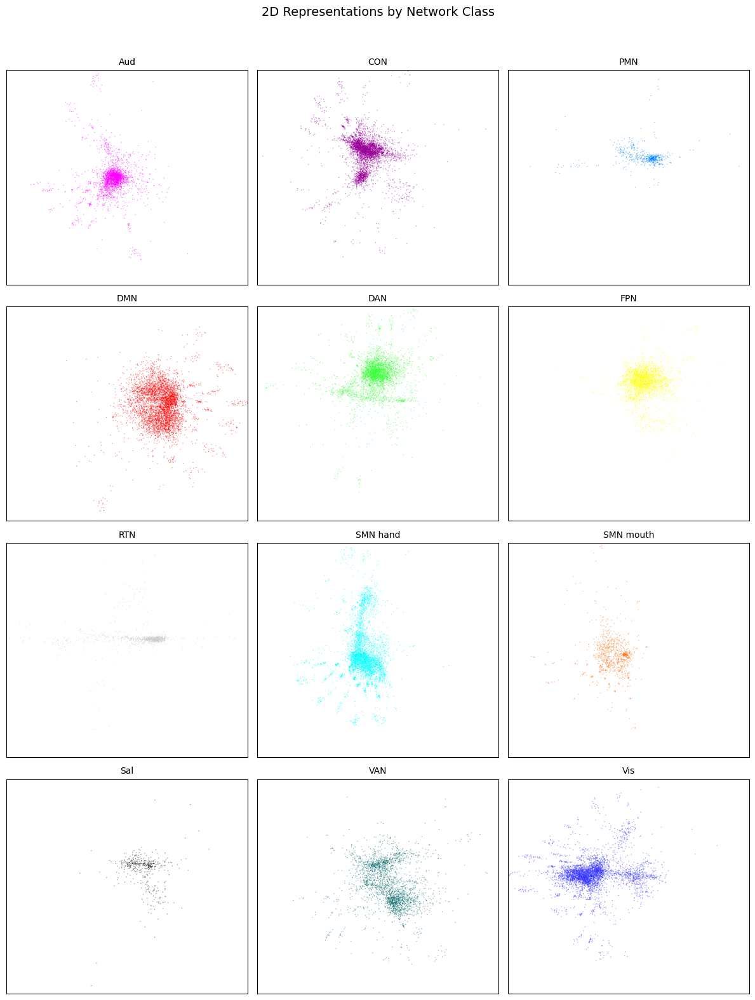

In [28]:
visualize_representations_subplots(mus_washu120, labels_washu120, net_names, net_colors, s=1, alpha=0.5)

In [29]:
def calculate_dunn_index(X, labels):
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    # Compute intra-cluster distances (max pairwise distance within each cluster)
    intra_dists = []
    for lbl in unique_labels:
        cluster_points = X[labels == lbl]
        if len(cluster_points) > 1:
            dists = cdist(cluster_points, cluster_points, metric='euclidean')
            intra_dists.append(np.max(dists))
        else:
            intra_dists.append(0.0)  # only one point, no intra-dist

    max_intra_dist = max(intra_dists)

    # Compute inter-cluster distances (min pairwise distance between any two clusters)
    inter_dists = []
    for i in range(n_clusters):
        for j in range(i+1, n_clusters):
            pts_i = X[labels == unique_labels[i]]
            pts_j = X[labels == unique_labels[j]]
            dist = np.min(cdist(pts_i, pts_j, metric='euclidean'))
            inter_dists.append(dist)

    min_inter_dist = min(inter_dists)
    return min_inter_dist / max_intra_dist if max_intra_dist > 0 else 0

In [30]:
dunn_washu120 = calculate_dunn_index(mus_washu120, labels_washu120)
si_washu120 = silhouette_score(mus_washu120, labels_washu120, metric="euclidean")
dbi_washu120 = davies_bouldin_score(mus_washu120, labels_washu120)

print(dunn_washu120)
print(si_washu120)
print(dbi_washu120)

4.602261948134245e-06
-0.06206254
7.9835866635685875


## HCP 94 subjects

In [29]:
with open("./data/cohort_files/HCP_94unrelated.txt") as f:
    hcp_subjects = [line.strip() for line in f]

print(hcp_subjects)
n_hcp_subjects = len(hcp_subjects)

parcel_labels_333 = parcel_keys[:, 1].flatten() - 1
print(parcel_labels_333.shape)

['100307', '100408', '101107', '101309', '101915', '103111', '103414', '103818', '105014', '105115', '106016', '108828', '110411', '111312', '111716', '113619', '113922', '114419', '115320', '116524', '117122', '118528', '118730', '118932', '120111', '122317', '122620', '123117', '123925', '124422', '125525', '126325', '127630', '127933', '128127', '128632', '129028', '130013', '130316', '131217', '131722', '133019', '133928', '135225', '135932', '138534', '139637', '140925', '144832', '146432', '147737', '148335', '148840', '149337', '149539', '149741', '151223', '151627', '153025', '154734', '156637', '159340', '160123', '161731', '163129', '176542', '178950', '188347', '189450', '190031', '192540', '196750', '198451', '199655', '201111', '208226', '211417', '212318', '214423', '221319', '239944', '245333', '280739', '397760', '414229', '499566', '654754', '672756', '751348', '756055', '792564', '856766', '857263', '899885']
(333,)


## HCP Resting-state visualizations

(286, 94, 2)


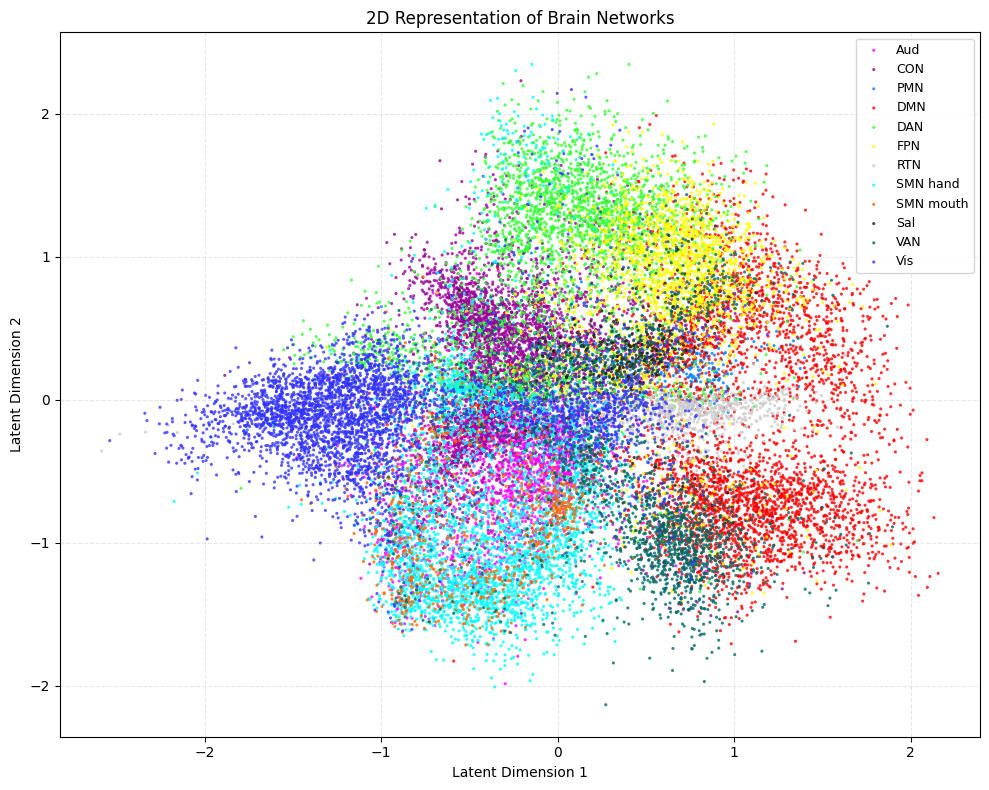

In [30]:
# refer to "/data/wheelock/data1/people/Cindy/rfMRI_VAE/rsfMRI-VAE/main_compare_HCP94_allcleanframes.m"
pca_latent_file = "/data/wheelock/data1/people/Cindy/rfMRI_VAE/rsfMRI-VAE/result/pca_latent/unrelated_94subjects_HCPtest_Gordon333Parcel_washu120_subsample10_randperm1_train100_zdim2.txt"
ica_latent_file = "/data/wheelock/data1/people/Cindy/rfMRI_VAE/rsfMRI-VAE/result/fastica_latent/unrelated_94subjects_HCPtest_Gordon333Parcel_washu120_subsample10_randperm1_train100_zdim2.txt"
umap_latent_file = "/data/wheelock/data1/people/Cindy/rfMRI_VAE/rsfMRI-VAE/result/umap_latent/unrelated_94subjects_HCPtest_Gordon333Parcel_washu120_subsample10_randperm1_train100_zdim2.txt"
vae_latent_folder = "/data/wheelock/data1/people/Cindy/rfMRI_VAE/rsfMRI-VAE/result/latent/unrelated_94subjects_HCPtest_Gordon333Parcel_Zdim2/"
vae_latent2_folder = "/data/wheelock/data1/people/Cindy/rfMRI_VAE/rsfMRI-VAE/result/latent/unrelated_94subjects_HCPretest_Gordon333Parcel_Zdim2/"

vae_latents = []
vae_latents2 = []

for i, subj in enumerate(hcp_subjects):
    vae_latent_filepath = os.path.join(vae_latent_folder, f"save_z{i}.mat")
    vae_latent2_filepath = os.path.join(vae_latent2_folder, f"save_z{i}.mat")
    data = sio.loadmat(vae_latent_filepath)
    data2 = sio.loadmat(vae_latent2_filepath)
    z = data['z_distribution']
    z2 = data2['z_distribution']
    mu = z[:, :2]
    mu2 = z2[:, :2]
    mu = mu[parcel_order, :]
    mu2 = mu2[parcel_order, :]
    mu = mu[keepnets, :]
    mu2 = mu2[keepnets, :]
    vae_latents.append(mu)
    vae_latents2.append(mu2)

vae_latents = np.transpose(np.stack(vae_latents, axis=0), (1, 0, 2))
vae_latents2 = np.transpose(np.stack(vae_latents2, axis=0), (1, 0, 2))

hcp_labels = np.repeat(parcel_labels, vae_latents.shape[1])
vae_latents_all = vae_latents.reshape(-1, vae_latents.shape[2])
vae_latents2_all = vae_latents2.reshape(-1, vae_latents.shape[2])

print(vae_latents2.shape)
visualize_representations(vae_latents2_all, hcp_labels, net_names, net_colors)

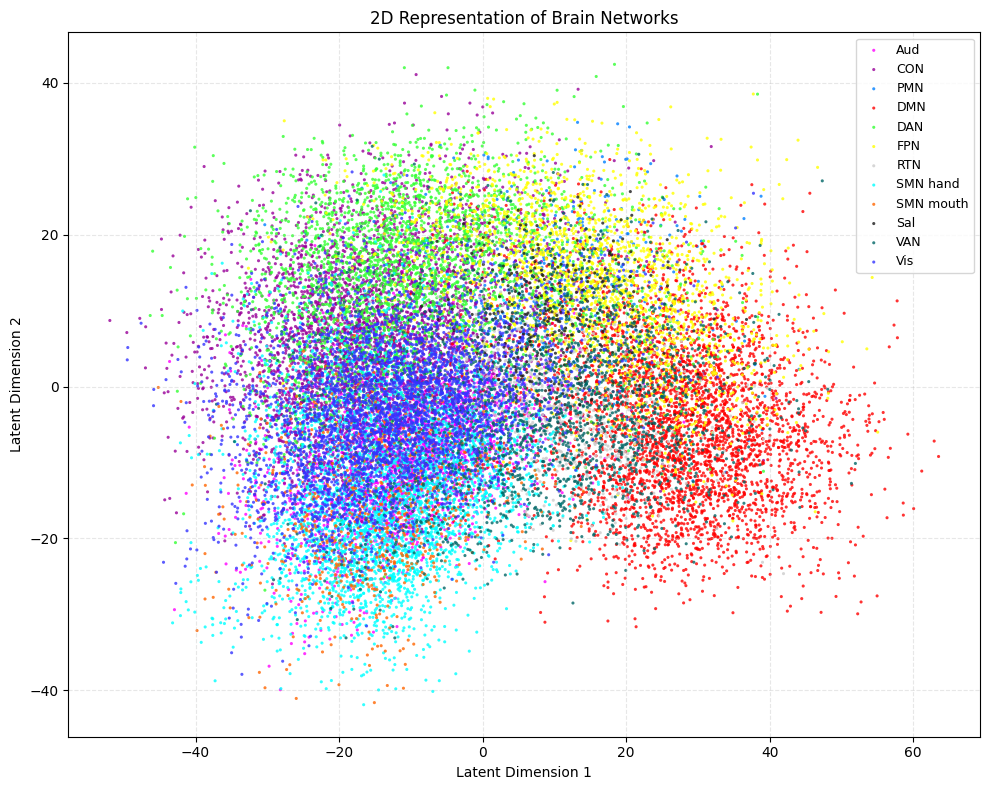

In [31]:
pca_latents = np.loadtxt(pca_latent_file)
pca_latents = np.reshape(pca_latents, (333, n_hcp_subjects, 2), order='F')
pca_latents = pca_latents[parcel_order, :, :]
pca_latents = pca_latents[keepnets, :, :]
pca_latents_all = pca_latents.reshape(-1, pca_latents.shape[2])

visualize_representations(pca_latents_all, hcp_labels, net_names, net_colors)

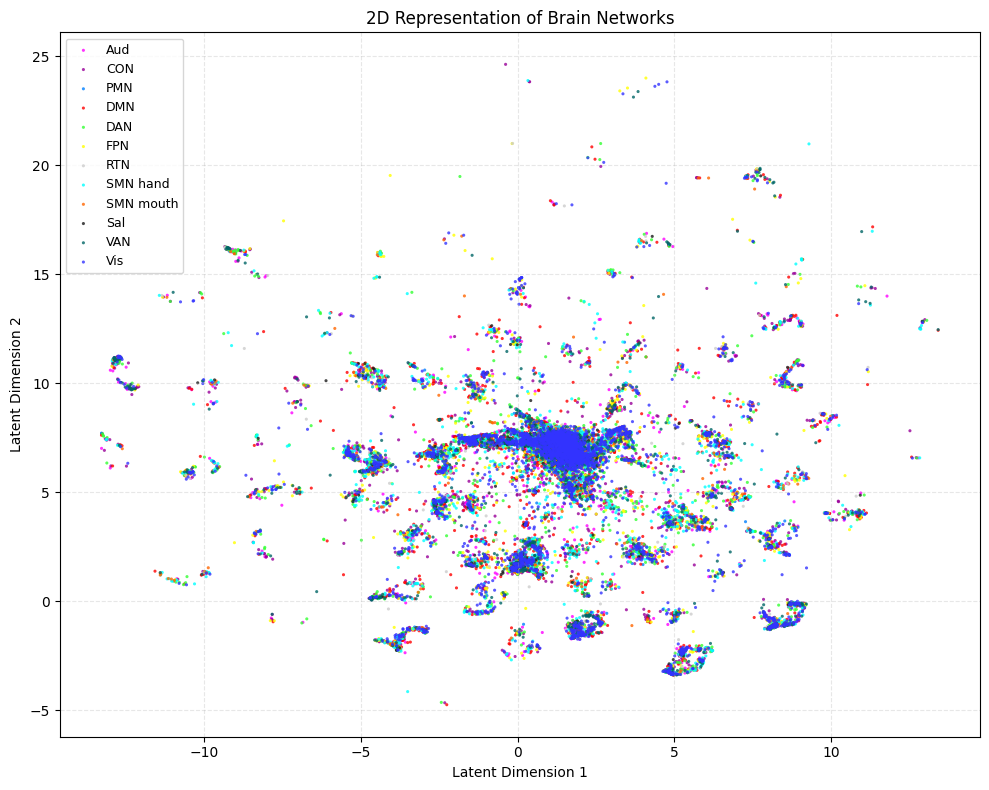

In [185]:
ica_latents = np.loadtxt(ica_latent_file)
ica_latents = ica_latents.reshape(333, n_hcp_subjects, 2)
ica_latents = ica_latents[parcel_order, :, :]
ica_latents = ica_latents[keepnets, :, :]

umap_latents = np.loadtxt(umap_latent_file)
umap_latents = umap_latents.reshape(333, n_hcp_subjects, 2)
umap_latents = umap_latents[parcel_order, :, :]
umap_latents = umap_latents[keepnets, :, :]
umap_latents_all = umap_latents.reshape(-1, umap_latents.shape[2])

visualize_representations(umap_latents_all, hcp_labels, net_names, net_colors)

In [186]:
# visualize_representations_subplots(pca_latents_all, hcp_labels, net_names, net_colors)

In [187]:
def compute_cluster_metrics(X, labels):
    """
    Compute clustering metrics:
    - Per-class SI mean and std
    - Global SI mean and std
    - Global DBI and Dunn index
    
    Returns:
        dict with keys:
            'classes', 'SI_mean_per_class', 'SI_std_per_class',
            'SI_mean_global', 'SI_std_global',
            'DBI_global', 'Dunn_global'
    """
    unique_labels = np.unique(labels)
    
    # Per-class SI stats
    SI_mean_per_class = []
    SI_std_per_class = []
    for cls in unique_labels:
        X_cls = X[labels == cls]
        y_cls = labels[labels == cls]
        if len(np.unique(y_cls)) < 2 or len(X_cls) < 3:
            SI_mean_per_class.append(np.nan)
            SI_std_per_class.append(np.nan)
            continue
        sil_cls = silhouette_samples(X_cls, y_cls)
        SI_mean_per_class.append(np.mean(sil_cls))
        SI_std_per_class.append(np.std(sil_cls))

    # Global metrics
    silhouette_vals = silhouette_samples(X, labels)
    SI_mean_global = np.mean(silhouette_vals)
    SI_std_global = np.std(silhouette_vals)

    DBI_global = davies_bouldin_score(X, labels)
    Dunn_global = calculate_dunn_index(X, labels)

    return {
        'classes': unique_labels.tolist(),
        'SI_mean_per_class': SI_mean_per_class,
        'SI_std_per_class': SI_std_per_class,
        'SI_mean_global': SI_mean_global,
        'SI_std_global': SI_std_global,
        'DBI_global': DBI_global,
        'Dunn_global': Dunn_global
    }

In [188]:
vae_metrics_hcp = compute_cluster_metrics(np.mean(vae_latents, axis=1), parcel_labels)
pca_metrics_hcp = compute_cluster_metrics(np.mean(pca_latents, axis=1), parcel_labels)
ica_metrics_hcp = compute_cluster_metrics(np.mean(ica_latents, axis=1), parcel_labels)
umap_metrics_hcp = compute_cluster_metrics(np.mean(umap_latents, axis=1), parcel_labels)

print(pca_metrics_hcp)

{'classes': [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12], 'SI_mean_per_class': [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan], 'SI_std_per_class': [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan], 'SI_mean_global': -0.1439188174663017, 'SI_std_global': 0.10394082243217265, 'DBI_global': 29.297773798896568, 'Dunn_global': 0.0015323768980097633}


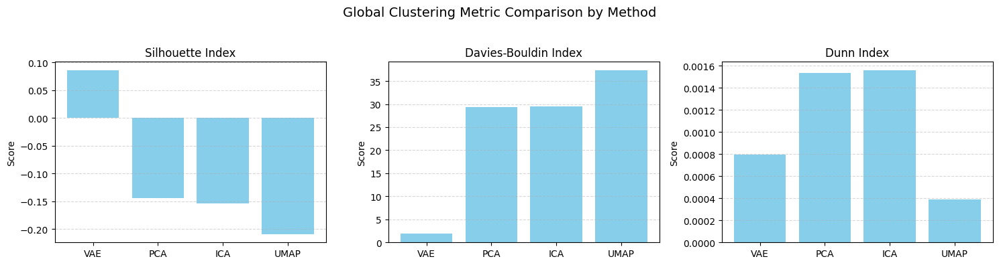

In [189]:
# Assume you've already run:
# vae_metrics_hcp, pca_metrics_hcp, ica_metrics_hcp, umap_metrics_hcp

# # Step 1: Organize the data
# methods = ['VAE', 'PCA', 'ICA', 'UMAP']
# si_means = [
#     vae_metrics_hcp['SI_mean_global'],
#     pca_metrics_hcp['SI_mean_global'],
#     ica_metrics_hcp['SI_mean_global'],
#     umap_metrics_hcp['SI_mean_global']
# ]
# dbi_vals = [
#     vae_metrics_hcp['DBI_global'],
#     pca_metrics_hcp['DBI_global'],
#     ica_metrics_hcp['DBI_global'],
#     umap_metrics_hcp['DBI_global']
# ]
# dunn_vals = [
#     vae_metrics_hcp['Dunn_global'],
#     pca_metrics_hcp['Dunn_global'],
#     ica_metrics_hcp['Dunn_global'],
#     umap_metrics_hcp['Dunn_global']
# ]

# # Step 2: Grouped bar plot
# metrics = ['SI ', 'DBI ', 'Dunn ']
# data = [si_means, dbi_vals, dunn_vals]
# data = np.array(data)  # shape: (3 metrics, 4 methods)

# x = np.arange(len(metrics))  # metric positions
# width = 0.2

# fig, ax = plt.subplots(figsize=(8, 5))

# for i in range(len(methods)):
#     ax.bar(x + i * width, data[:, i], width, label=methods[i])

# # Step 3: Aesthetics
# ax.set_ylabel('Metric Value')
# ax.set_title('Global Clustering Metrics Comparison')
# ax.set_xticks(x + 1.5 * width)
# ax.set_xticklabels(metrics)
# ax.legend()
# ax.grid(axis='y', linestyle='--', alpha=0.5)

# plt.tight_layout()
# plt.show()


# # Original metrics
# methods = ['VAE', 'PCA', 'ICA', 'UMAP']
# si = np.array([
#     vae_metrics_hcp['SI_mean_global'],
#     pca_metrics_hcp['SI_mean_global'],
#     ica_metrics_hcp['SI_mean_global'],
#     umap_metrics_hcp['SI_mean_global']
# ])
# dbi = np.array([
#     vae_metrics_hcp['DBI_global'],
#     pca_metrics_hcp['DBI_global'],
#     ica_metrics_hcp['DBI_global'],
#     umap_metrics_hcp['DBI_global']
# ])
# dunn = np.array([
#     vae_metrics_hcp['Dunn_global'],
#     pca_metrics_hcp['Dunn_global'],
#     ica_metrics_hcp['Dunn_global'],
#     umap_metrics_hcp['Dunn_global']
# ])

# # Avoid log(0)
# eps = 1e-10

# # Apply log10 to all metrics
# si_log = np.log10(si + eps)      # Higher is better
# dbi_log = -np.log10(dbi + eps)   # Lower is better, so invert sign
# dunn_log = np.log10(dunn + eps)  # Higher is better

# # Combine log-scaled data
# data_log = np.array([si_log, dbi_log, dunn_log])  # shape: (3 metrics, 4 methods)

# # Plot grouped bar chart
# x = np.arange(3)
# width = 0.2

# fig, ax = plt.subplots(figsize=(8, 5))
# for i, method in enumerate(methods):
#     ax.bar(x + i * width, data_log[:, i], width, label=method)

# # Axis and annotations
# ax.set_ylabel('log10(Score) (? better)')
# ax.set_title('Global Clustering Metrics (Log-Scaled)')
# ax.set_xticks(x + 1.5 * width)
# ax.set_xticklabels(['Silhouette (?)', 'DBI (?)', 'Dunn (?)'])
# ax.legend()
# ax.grid(axis='y', linestyle='--', alpha=0.5)

# plt.tight_layout()
# plt.show()
# Metric data (replace with your actual values if needed)
methods = ['VAE', 'PCA', 'ICA', 'UMAP']
si = np.array([
    vae_metrics_hcp['SI_mean_global'],
    pca_metrics_hcp['SI_mean_global'],
    ica_metrics_hcp['SI_mean_global'],
    umap_metrics_hcp['SI_mean_global']
])
dbi = np.array([
    vae_metrics_hcp['DBI_global'],
    pca_metrics_hcp['DBI_global'],
    ica_metrics_hcp['DBI_global'],
    umap_metrics_hcp['DBI_global']
])
dunn = np.array([
    vae_metrics_hcp['Dunn_global'],
    pca_metrics_hcp['Dunn_global'],
    ica_metrics_hcp['Dunn_global'],
    umap_metrics_hcp['Dunn_global']
])

# Create subplots: 1 row, 3 columns
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Metric names and values
metric_names = ['Silhouette Index', 'Davies-Bouldin Index', 'Dunn Index']
metric_data = [si, dbi, dunn]

# Plot each metric as a bar chart
for i, ax in enumerate(axs):
    ax.bar(methods, metric_data[i], color='skyblue')
    ax.set_title(metric_names[i])
    ax.set_ylabel('Score')
    ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.suptitle('Global Clustering Metric Comparison by Method', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## Working memory

In [190]:
working_memory_parcellation_file = "/data/wheelock/data1/parcellations/333parcels/Parcels_LR.dtseries.nii"
working_memory_parcellation_cifti = nib.load(working_memory_parcellation_file)
working_memory_parcellation = np.squeeze(working_memory_parcellation_cifti.get_fdata().astype(int))
print(working_memory_parcellation.shape)

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


(59412,)


In [191]:
hcp_working_memory_folder = "/data/wheelock/data1/datasets/HCP/WorkingMemory/pconn"

mus_wm, labels_wm, subj_indices_wm = [], [], []
profile_dist_mats_wm, latent_dist_mats_wm = [], [] # to record the Euclidean distance matrices

for idx, subj in enumerate(tqdm(hcp_subjects, desc="Upsampling correlations and inference")):
    pconns_path = retrieve_filepath(hcp_working_memory_folder, subj, ".pconn.txt")
    corrs_parcel_fisherZ_transformed = np.loadtxt(pconns_path, delimiter=",")
    corrs_parcel = np.tanh(corrs_parcel_fisherZ_transformed) # invert Fisher-z transformation
    

    n_parcels = corrs_parcel.shape[0]
    n_vertices = len(working_memory_parcellation)
    parcel_vertex_corrs = np.zeros((n_parcels, n_vertices))

    # Ensure parcellation values are in 0 (unassigned) to n_parcels
    assert working_memory_parcellation.max() <= n_parcels

    # upsampling from 333 parcels to 59412 vertices for each parcel
    # for i in range(n_parcels):
    #     corrs_to_parcels = np.squeeze(corrs_parcel[i, :]) # (n_parcels, )
    #     corrs_to_vertices = np.zeros((n_vertices, ))
    #     for j in range(n_parcels):
    #         corrs_to_vertices[working_memory_parcellation==(j+1)] = corrs_to_parcels[j]
    #     parcel_vertex_corrs[i, :] = corrs_to_vertices

    for parcel_idx in range(n_parcels):
        # Get correlation of this parcel to all parcels
        corrs_to_parcels = corrs_parcel[parcel_idx, :]  # shape (n_parcels,)

        # Initialize vertex-level correlation vector
        corrs_to_vertices = np.zeros(n_vertices)

        for target_parcel_idx in range(n_parcels):
            vertex_mask = working_memory_parcellation == (target_parcel_idx + 1)
            corrs_to_vertices[vertex_mask] = corrs_to_parcels[target_parcel_idx]

        parcel_vertex_corrs[parcel_idx, :] = corrs_to_vertices

    parcel_vertex_corrs = parcel_vertex_corrs[parcel_order, :] # reorder
    # parcel_vertex_corrs = parcel_vertex_corrs[keepnets, :]
    # print(parcel_vertex_corrs.shape)

    # reformatting
    l_surf, r_surf = forward_reformatting(parcel_vertex_corrs, "./mask", img_size=192)
    # model inference
    zs, _, _ = model_inference(l_surf, r_surf, zdim=2, nc=1, mode="both", batch_size=16, device="cpu")
    mus = zs[:, :2]

    # calculate Euclidean distances for latent embeddings, and correlational distances for profiles
    # corrs_parcel = corrs_parcel[np.ix_(parcel_order, parcel_order)] # reorder
    # corrs_parcel_specified = corrs_parcel[keepnets][:, keepnets] # apply mask 
    corrs_parcel_specified = np.corrcoef(parcel_vertex_corrs)
    # profile_dist_mat = cdist(parcel_vertex_corrs, parcel_vertex_corrs, metric='euclidean')
    profile_dist_mat = 1.0 - corrs_parcel_specified
    # latent_dist_mat = cdist(mus, mus, metric='euclidean')
    latent_dist_mat = pairwise_distances(mus, metric='euclidean')
    
    # record in lists
    mus_wm.append(mus)
    labels_wm.append(parcel_labels_333)
    subj_indices_wm.append(np.full(parcel_vertex_corrs.shape[0], idx))

    profile_dist_mats_wm.append(profile_dist_mat)
    latent_dist_mats_wm.append(latent_dist_mat)

# Combine all subject data
mus_wm = np.concatenate(mus_wm)
labels_wm = np.concatenate(labels_wm)
subj_indices_wm = np.concatenate(subj_indices_wm)
profile_dist_mats_wm = np.stack(profile_dist_mats_wm, axis=0)
latent_dist_mats_wm = np.stack(latent_dist_mats_wm, axis=0)

print(mus_wm.shape)
print(labels_wm.shape)

np.savez_compressed("./data/inference_results/hcp_wm_333.npz",
                    mus=mus_wm,
                    labels=labels_wm,
                    subj_indices=subj_indices_wm, 
                    profile_dist_mats=profile_dist_mats_wm, 
                    latent_dist_mats=latent_dist_mats_wm)


Upsampling correlations and inference: 100%|██████████| 94/94 [08:11<00:00,  5.23s/it]


(31302, 2)
(31302,)


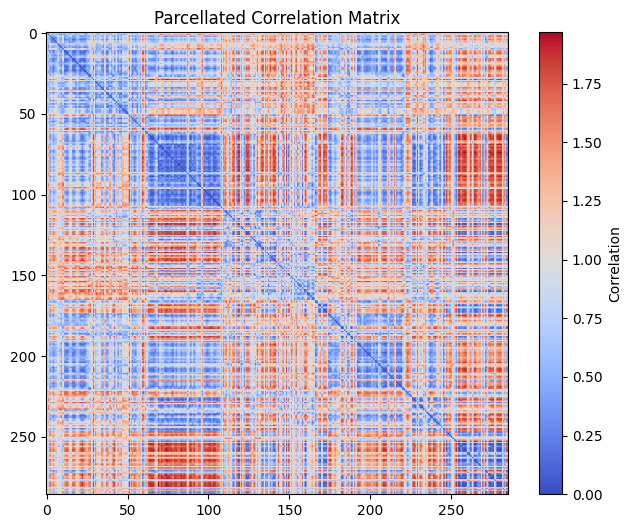

In [41]:
plt.figure(figsize=(8, 6))
plt.imshow(1 - corrs_parcel_specified, cmap='coolwarm', vmin=0)
plt.colorbar(label='Correlation')
plt.title('Parcellated Correlation Matrix')
plt.show()

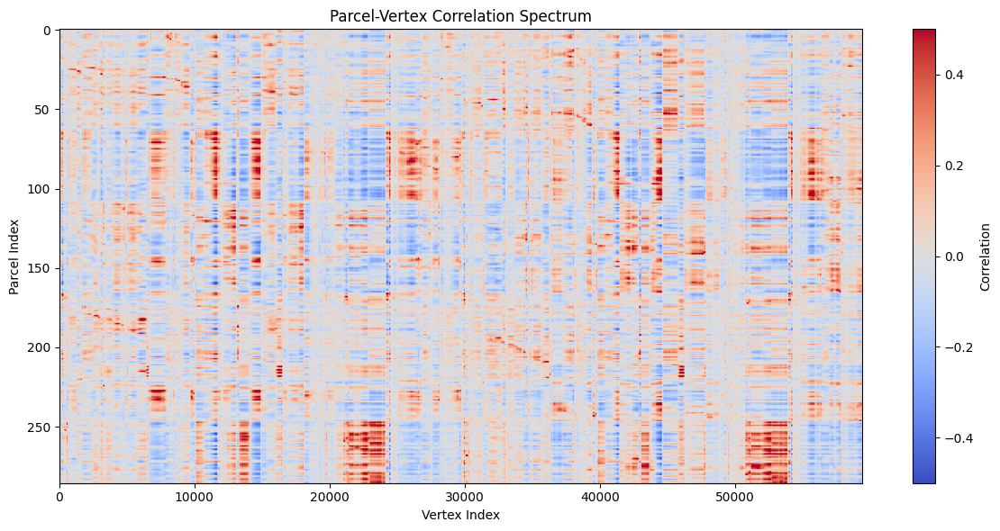

In [42]:
plt.figure(figsize=(12, 6))
plt.imshow(parcel_vertex_corrs, aspect='auto', cmap='coolwarm', vmin=-0.5, vmax=0.5)
plt.colorbar(label='Correlation')
plt.xlabel('Vertex Index')
plt.ylabel('Parcel Index')
plt.title('Parcel-Vertex Correlation Spectrum')
plt.tight_layout()
plt.show()

In [43]:
inference_results_wm = np.load("./data/inference_results/hcp_wm.npz")
mus_wm = inference_results_wm["mus"]
labels_wm = inference_results_wm["labels"]
subj_indices_wm = inference_results_wm["subj_indices"]
profile_dist_mats_wm = inference_results_wm["profile_dist_mats"]
latent_dist_mats_wm = inference_results_wm["latent_dist_mats"]

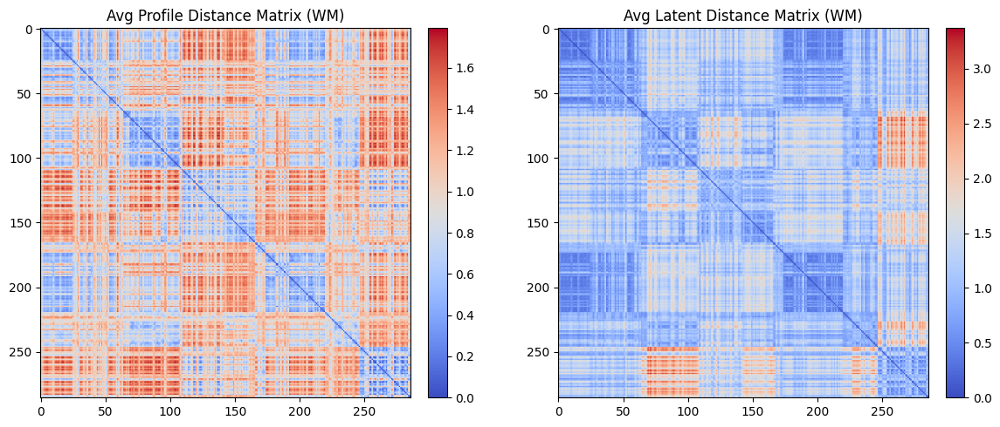

In [44]:
avg_profile_distmat_wm = np.mean(profile_dist_mats_wm, axis=0)
avg_latent_distmat_wm = np.mean(latent_dist_mats_wm, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# First subplot: average profile distance matrix
im1 = axes[0].imshow(avg_profile_distmat_wm, cmap='coolwarm')
axes[0].set_title('Avg Profile Distance Matrix (WM)')
fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)

# Second subplot: average latent distance matrix
im2 = axes[1].imshow(avg_latent_distmat_wm, cmap='coolwarm')
axes[1].set_title('Avg Latent Distance Matrix (WM)')
fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

In [45]:
n_parcels_specified = avg_profile_distmat_wm.shape[0]
triu_indices = np.triu_indices(n_parcels_specified, k=1)

profile_distances = profile_dist_mats_wm[:, triu_indices[0], triu_indices[1]].flatten()
latent_distances = latent_dist_mats_wm[:, triu_indices[0], triu_indices[1]].flatten()

r_value, p_value = pearsonr(profile_distances, latent_distances)

print(r_value)

0.5469298086109683


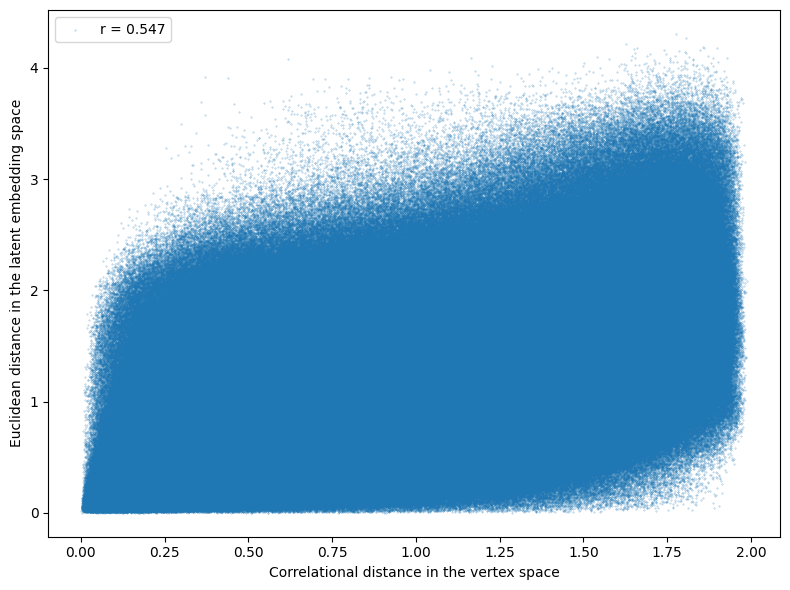

In [46]:
plt.figure(figsize=(8, 6))
plt.scatter(profile_distances, latent_distances, s=0.1, alpha=0.5, label=f"r = {r_value:.3f}")
plt.xlabel("Correlational distance in the vertex space")
plt.ylabel("Euclidean distance in the latent embedding space")
# plt.title("Correlation between Upper Triangles")
plt.legend()
# plt.grid(True)
plt.tight_layout()
plt.show()

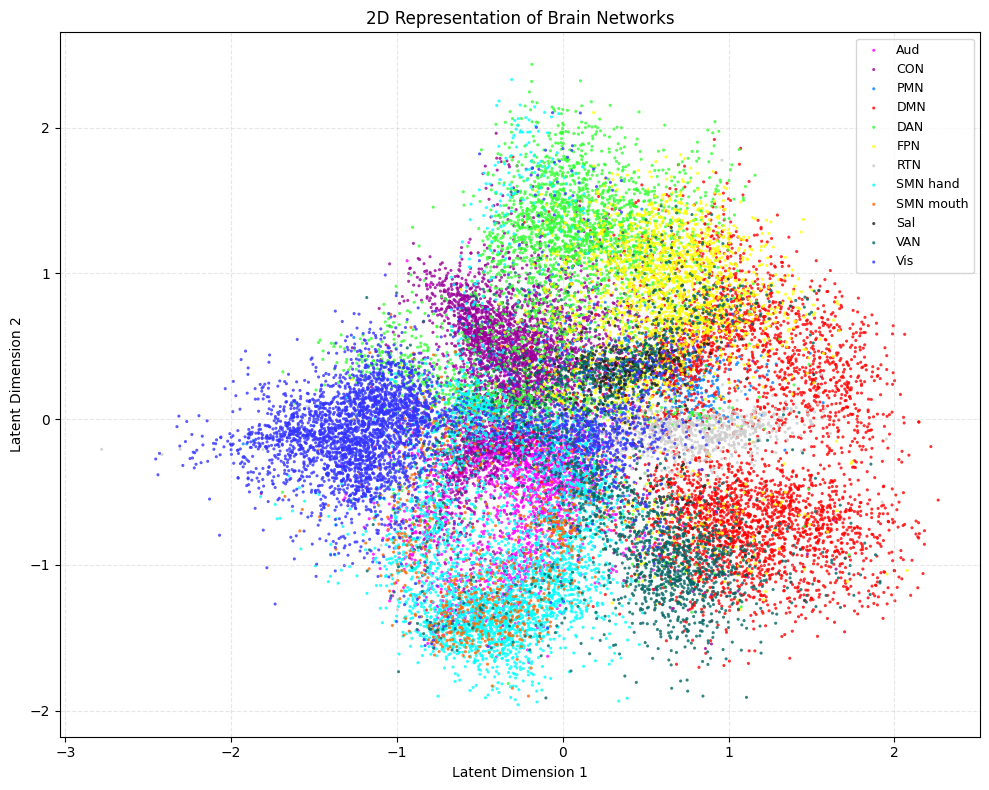

In [47]:
visualize_representations(vae_latents_all, hcp_labels, net_names, net_colors)

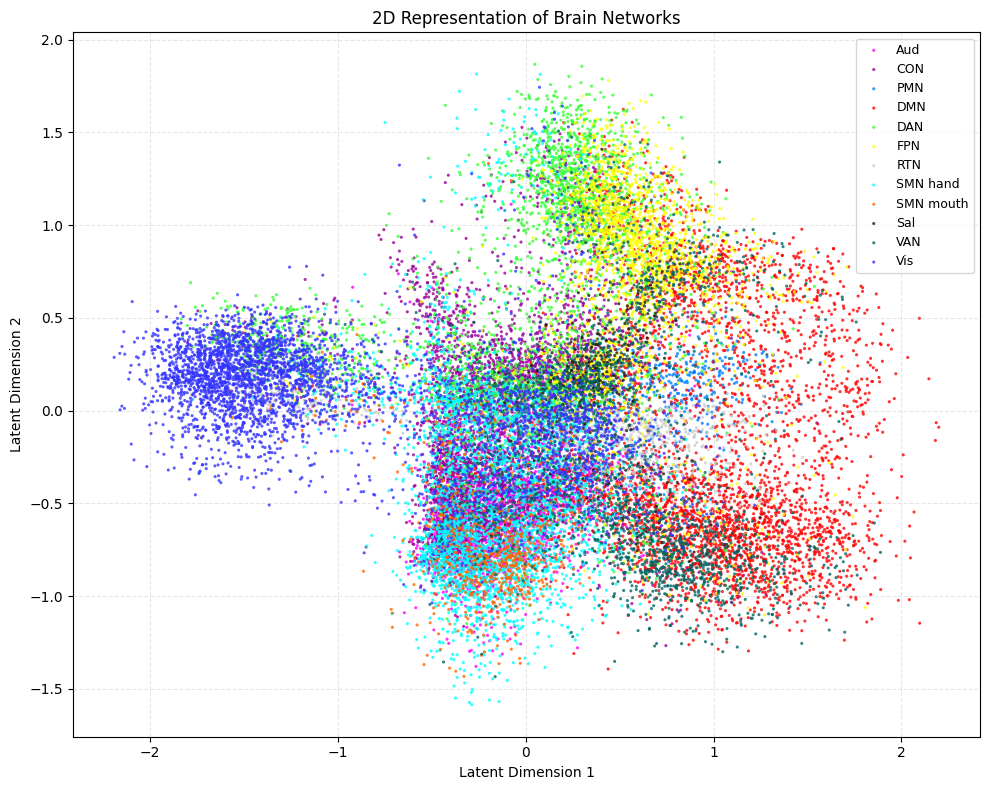

In [48]:
visualize_representations(mus_wm, labels_wm, net_names, net_colors)

In [49]:
def visualize_representations_comparison(mus_list, labels_list, net_names, net_colors, s=5, alpha=0.8):
    """
    Visualizes two 2D representations side-by-side using fixed axis limits and minimal formatting.

    Parameters
    ----------
    mus_list : list of two ndarrays (each of shape (n_samples, 2))
        List of 2D embeddings for two datasets.

    labels_list : list of two ndarrays
        Corresponding labels for the two datasets.

    net_names : ndarray
        Array of network names (13,), where each is a 1-element string array.

    net_colors : ndarray
        Array of RGB colors (13, 3) for each network.

    s : int
        Size of scatter points.

    alpha : float
        Transparency of scatter points.
    """
    if net_colors.max() > 1:
        colors = net_colors / 255.0
    else:
        colors = net_colors

    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

    for ax, mus, labels in zip(axes, mus_list, labels_list):
        unique_labels = np.unique(labels)
        for label in unique_labels:
            name = net_names[label].item()
            if name in ["None", "USp"]:
                continue
            mask = labels == label
            ax.scatter(mus[mask, 0], mus[mask, 1],
                       color=colors[label],
                       s=s, alpha=alpha, edgecolors='none')

        ax.set_xlim([-3, 3])
        ax.set_ylim([-2, 2.5])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('dim 1', fontsize=20)
        ax.set_ylabel('dim 2', fontsize=20)
        ax.grid(False)
        ax.set_title('')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        ax.legend().set_visible(False)

    plt.tight_layout()
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


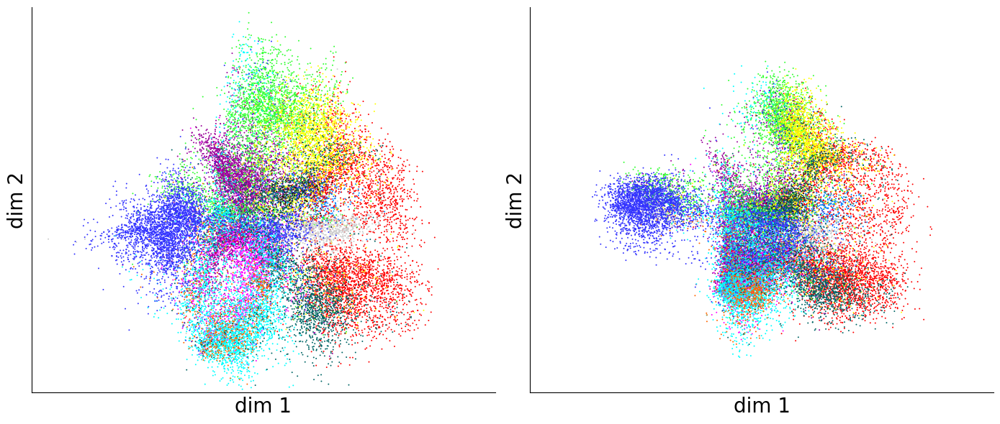

In [50]:
visualize_representations_comparison([vae_latents_all, mus_wm], [hcp_labels, labels_wm], net_names, net_colors, s=2, alpha=1)

In [51]:
# calculate the average parcel latents across 94 subjects
def compute_parcel_means(X, parcels):
    unique_labels = np.unique(parcels)
    means = np.array([X[parcels == lbl].mean(axis=0) for lbl in unique_labels])
    return means  # shape: (n_parcels, n_features)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


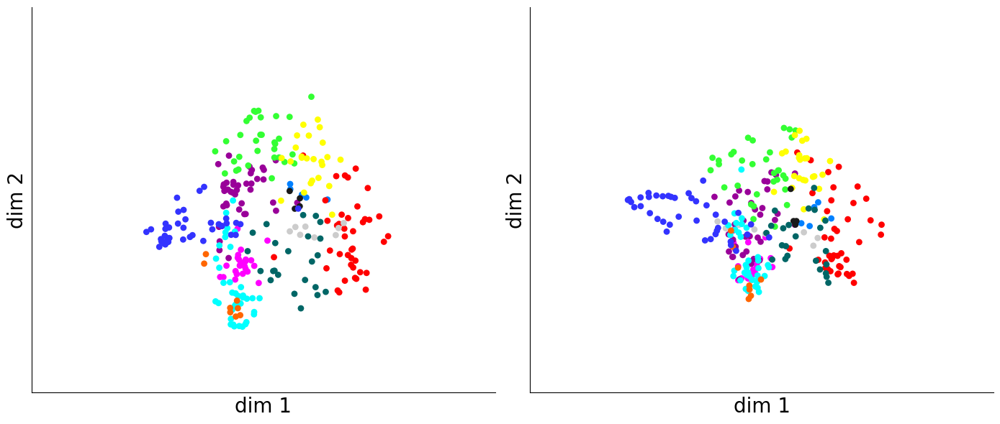

In [52]:
mus_reshaped_wm = mus_wm.reshape(len(hcp_subjects), keepnets.sum(), 2).transpose(1, 0, 2)
mus_mean_wm = np.mean(mus_reshaped_wm, axis=1)
mus_mean_rs = np.mean(vae_latents, axis=1)

visualize_representations_comparison([mus_mean_rs, mus_mean_wm], [parcel_labels, parcel_labels], net_names, net_colors, s=40, alpha=1)

In [53]:
def plot_silhouette_per_class(latent_embeddings, labels, net_names, net_colors, metric='euclidean'):
    """
    Computes and plots mean per-class silhouette scores from latent embeddings,
    with a dashed line for global mean SI, y=0 line, and styled display.
    """
    if net_colors.max() > 1:
        colors = net_colors / 255.0
    else:
        colors = net_colors

    silhouette_values = silhouette_samples(latent_embeddings, labels, metric=metric)
    global_mean_si = np.mean(silhouette_values)

    class_means, class_colors = [], []

    for label in np.unique(labels):
        name = net_names[label].item() if hasattr(net_names[label], 'item') else net_names[label]
        if name in ["None", "USp"]:
            continue

        mask = labels == label
        sil_vals_class = silhouette_values[mask]
        class_means.append(sil_vals_class.mean())
        class_colors.append(colors[label])

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.bar(range(len(class_means)), class_means, color=class_colors, edgecolor='black', alpha=0.9)

    # Reference lines
    plt.axhline(0, color='black', linewidth=1)
    plt.axhline(global_mean_si, linestyle='--', color='black', linewidth=1)

    # Annotate global mean SI, shifted toward center
    plt.text(len(class_means) * 0.95, 0.8, f"Mean SI = {global_mean_si:.3f}",
             ha='right', va='top', fontsize=24, color='black')

    # Styling
    plt.ylabel("SI", fontsize=24)
    plt.ylim(-0.5, 1)
    plt.yticks([-0.5, 0, 0.5, 1])
    plt.tick_params(axis='y', labelsize=16)
    plt.xticks([])
    plt.tick_params(axis='x', bottom=False)
    plt.grid(False)
    plt.legend().set_visible(False)
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


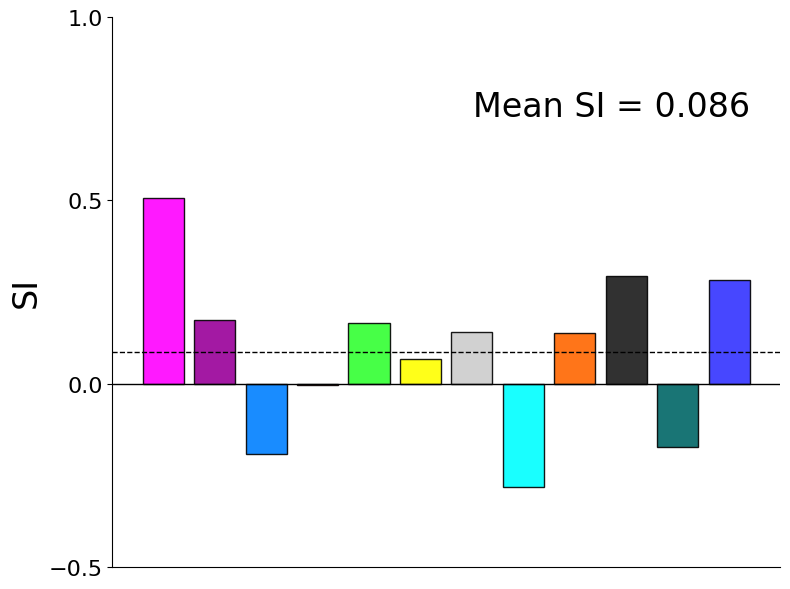

In [54]:
plot_silhouette_per_class(mus_mean_rs, parcel_labels, net_names, net_colors)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


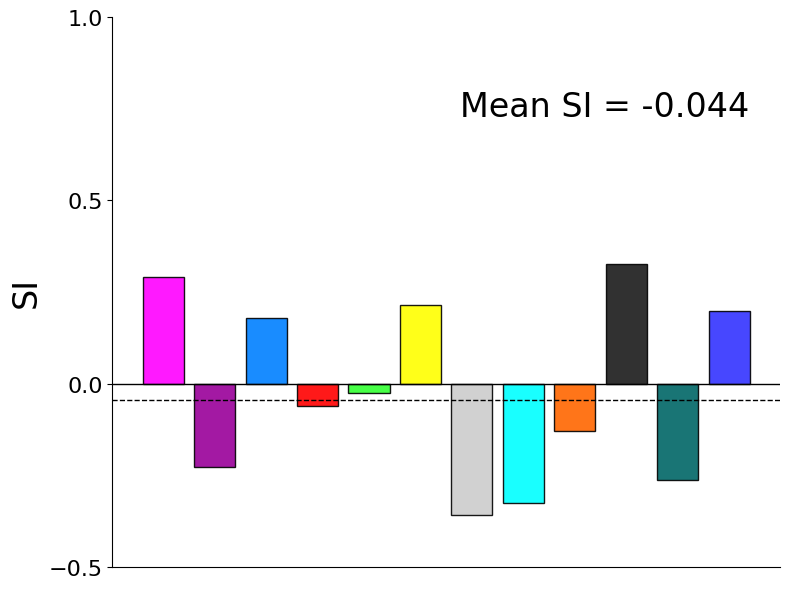

In [55]:
plot_silhouette_per_class(mus_mean_wm, parcel_labels, net_names, net_colors)

## HCP fingerprinting

In [56]:
def compute_subjectwise_cross_distance(latent_array_1, latent_array_2, metric='correlation'):
    """
    Compute subject-wise distance matrix between two latent arrays.
    Each array has shape (parcels, subjects, features).
    For each subject, extract parcel-wise Euclidean distances and flatten upper triangle.
    Then compute distances between corresponding subjects in the two arrays.

    Parameters
    ----------
    latent_array_1 : np.ndarray of shape (n_parcels, n_subjects, 2)
    latent_array_2 : np.ndarray of shape (n_parcels, n_subjects, 2)
    metric : str
        'correlation' or 'euclidean' ? distance metric to compare subject-level features

    Returns
    -------
    cross_dist_matrix : np.ndarray of shape (94, 94)
        Distance between subjects from array 1 and array 2.
        Each element (i, j) is the distance between subject i in array_1 and subject j in array_2.
    """
    n_parcels, n_subjects, _ = latent_array_1.shape

    # Step 1: Compute flattened upper-triangle parcel distance features per subject for each array
    features_1, features_2 = [], []

    for subj in range(n_subjects):
        # For latent_array_1
        dist1 = cdist(latent_array_1[:, subj, :], latent_array_1[:, subj, :], metric='euclidean')
        upper1 = dist1[np.triu_indices(n_parcels, k=1)]
        features_1.append(upper1)

        # For latent_array_2
        dist2 = cdist(latent_array_2[:, subj, :], latent_array_2[:, subj, :], metric='euclidean')
        upper2 = dist2[np.triu_indices(n_parcels, k=1)]
        features_2.append(upper2)

    # Step 2: Stack into (94, n_features)
    features_1 = np.stack(features_1, axis=0)
    features_2 = np.stack(features_2, axis=0)

    # Step 3: Compute 94 � 94 distance matrix between the two subject sets
    cross_dist_matrix = cdist(features_1, features_2, metric=metric)

    return cross_dist_matrix


In [57]:
def compute_subjectwise_cross_correlation(latent_array_1, latent_array_2, dist_metric="euclidean"):
    """
    Compute subject-wise correlation matrix between two latent arrays.
    Each array has shape (n_parcels, n_subjects, n_features).
    For each subject, extract parcel-wise Euclidean distances and flatten the upper triangle.
    Then compute Pearson correlation between subject-level feature vectors.

    Parameters
    ----------
    latent_array_1 : np.ndarray of shape (n_parcels, n_subjects, 2)
    latent_array_2 : np.ndarray of shape (n_parcels, n_subjects, 2)

    Returns
    -------
    cross_corr_matrix : np.ndarray of shape (n_subjects, n_subjects)
        Pearson correlation between each pair of subjects from array 1 and array 2.
    """
    n_parcels, n_subjects, _ = latent_array_1.shape

    # Step 1: Extract upper-triangle distance features for each subject
    features_1, features_2 = [], []

    for subj in range(n_subjects):
        dist1 = cdist(latent_array_1[:, subj, :], latent_array_1[:, subj, :], metric=dist_metric)
        upper1 = dist1[np.triu_indices(n_parcels, k=1)]
        features_1.append(upper1)

        dist2 = cdist(latent_array_2[:, subj, :], latent_array_2[:, subj, :], metric=dist_metric)
        upper2 = dist2[np.triu_indices(n_parcels, k=1)]
        features_2.append(upper2)

    # Stack into (n_subjects, n_features)
    features_1 = np.stack(features_1, axis=0)
    features_2 = np.stack(features_2, axis=0)

    concat = np.corrcoef(features_1, features_2)  # shape: (2*n_subjects, 2*n_subjects)
    cross_corr = concat[:n_subjects, n_subjects:]  # shape: (n_subjects, n_subjects)

    return cross_corr

In [58]:
def compute_subjectwise_pconn_correlation(pconns1, pconns2):
    """
    Given two (n_subjects, n_parcels, n_parcels) pconn arrays,
    computes subject-wise Pearson correlation matrix between their fingerprints.

    Parameters
    ----------
    pconns1 : np.ndarray of shape (n_subjects, n_parcels, n_parcels)
    pconns2 : np.ndarray of shape (n_subjects, n_parcels, n_parcels)

    Returns
    -------
    corr_matrix : np.ndarray of shape (n_subjects, n_subjects)
        Pearson correlation between each subject in pconns1 and each in pconns2.
    """
    n_subjects, n_parcels, _ = pconns1.shape

    # Step 1: Convert to correlation distance (1 - corr)
    dist1 = 1.0 - pconns1
    dist2 = 1.0 - pconns2

    # Step 2: Extract upper triangle (excluding diagonal) and flatten
    triu_idx = np.triu_indices(n_parcels, k=1)
    features1 = dist1[:, triu_idx[0], triu_idx[1]]  # shape: (n_subjects, n_features)
    features2 = dist2[:, triu_idx[0], triu_idx[1]]

    # Step 3: Compute Pearson correlation between each subject pair
    concat = np.corrcoef(features1, features2)
    corr_matrix = concat[:n_subjects, n_subjects:]
    return corr_matrix


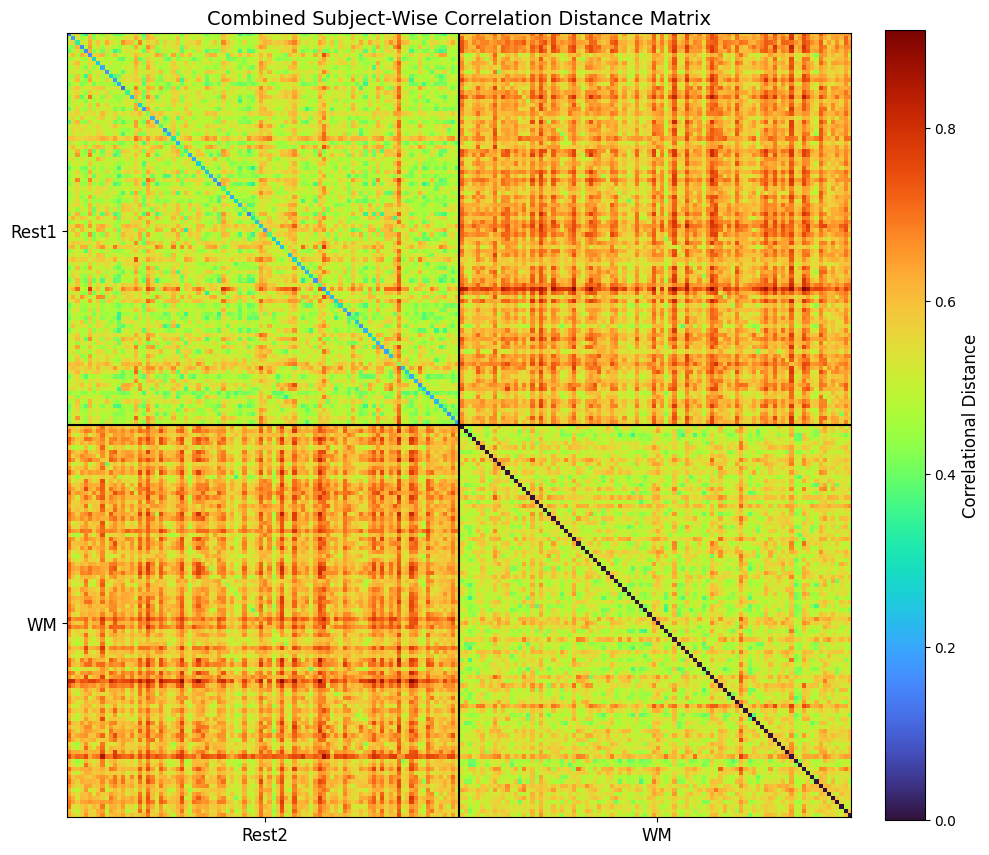

In [59]:
rest1_rest2_corrdist = compute_subjectwise_cross_distance(vae_latents, vae_latents2, metric="correlation")
rest1_wm_corrdist = compute_subjectwise_cross_distance(vae_latents, mus_reshaped_wm, metric="correlation")
rest2_wm_corrdist = compute_subjectwise_cross_distance(vae_latents2, mus_reshaped_wm, metric="correlation")
wm_wm_corrdist = compute_subjectwise_cross_distance(mus_reshaped_wm, mus_reshaped_wm, metric="correlation")

# Stack into a 188x188 matrix
top = np.hstack([rest1_rest2_corrdist, rest1_wm_corrdist])
bottom = np.hstack([rest2_wm_corrdist, wm_wm_corrdist])
combined = np.vstack([top, bottom])

# Create the plot
plt.figure(figsize=(10, 10))
im = plt.imshow(combined, cmap='turbo', vmin=0)

# Add quadrant dividers
plt.axvline(94 - 0.5, color='black', linewidth=1.5)
plt.axhline(94 - 0.5, color='black', linewidth=1.5)

# Add axis ticks roughly centered on each block
plt.xticks([47, 141], ['Rest2', 'WM'], fontsize=12)
plt.yticks([47, 141], ['Rest1', 'WM'], fontsize=12)

# Add axis labels
# plt.xlabel("Target Subject Set", fontsize=14)
# plt.ylabel("Query Subject Set", fontsize=14)

# Add colorbar
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label('Correlational Distance', fontsize=12)

# Add title
plt.title("Combined Subject-Wise Correlation Distance Matrix", fontsize=14)

plt.tight_layout()
plt.show()


In [60]:
def upper_triangle_stats(matrix):
    """
    Compute the mean and standard deviation of the upper triangle (excluding diagonal) of a 2D matrix.

    Parameters
    ----------
    matrix : np.ndarray of shape (n, n)

    Returns
    -------
    mean_val : float
        Mean of the upper triangle values (excluding diagonal).
    std_val : float
        Standard deviation of those values.
    """
    assert matrix.ndim == 2 and matrix.shape[0] == matrix.shape[1], "Input must be a square 2D matrix"

    triu_vals = matrix[np.triu_indices(matrix.shape[0], k=1)]
    mean_val = triu_vals.mean()
    std_val = triu_vals.std()

    return mean_val, std_val

In [111]:
rest1_rest1_corrs = compute_subjectwise_cross_correlation(vae_latents, vae_latents)
rest1_rest2_corrs = compute_subjectwise_cross_correlation(vae_latents, vae_latents2)
rest1_wm_corrs = compute_subjectwise_cross_correlation(vae_latents, mus_reshaped_wm)
rest2_wm_corrs = compute_subjectwise_cross_correlation(vae_latents2, mus_reshaped_wm)
wm_wm_corrs = compute_subjectwise_cross_correlation(mus_reshaped_wm, mus_reshaped_wm)

sio.savemat('./results/latent_corrs.mat', {'rest1_rest1_corrs': rest1_rest1_corrs, 'rest1_rest2_corrs': rest1_rest2_corrs, 
                                            'rest1_wm_corrs': rest1_wm_corrs, 'rest2_wm_corrs': rest2_wm_corrs, 'wm_wm_corrs': wm_wm_corrs})

In [63]:
rest1_rest1_mean, rest1_rest1_std = upper_triangle_stats(rest1_rest1_corrs)
wm_wm_mean, wm_wm_std = upper_triangle_stats(wm_wm_corrs)
rest1_wm_mean, rest1_wm_std = upper_triangle_stats(rest1_wm_corrs)

print(rest1_rest1_mean)
print(rest1_rest1_std)
print(wm_wm_mean)
print(wm_wm_std)
print(rest1_wm_mean)
print(rest1_wm_std)

0.4914297783926677
0.06538694388901324
0.4697583675032351
0.05942508571512827
0.3724390308203081
0.06594853344529099


### Visualizations

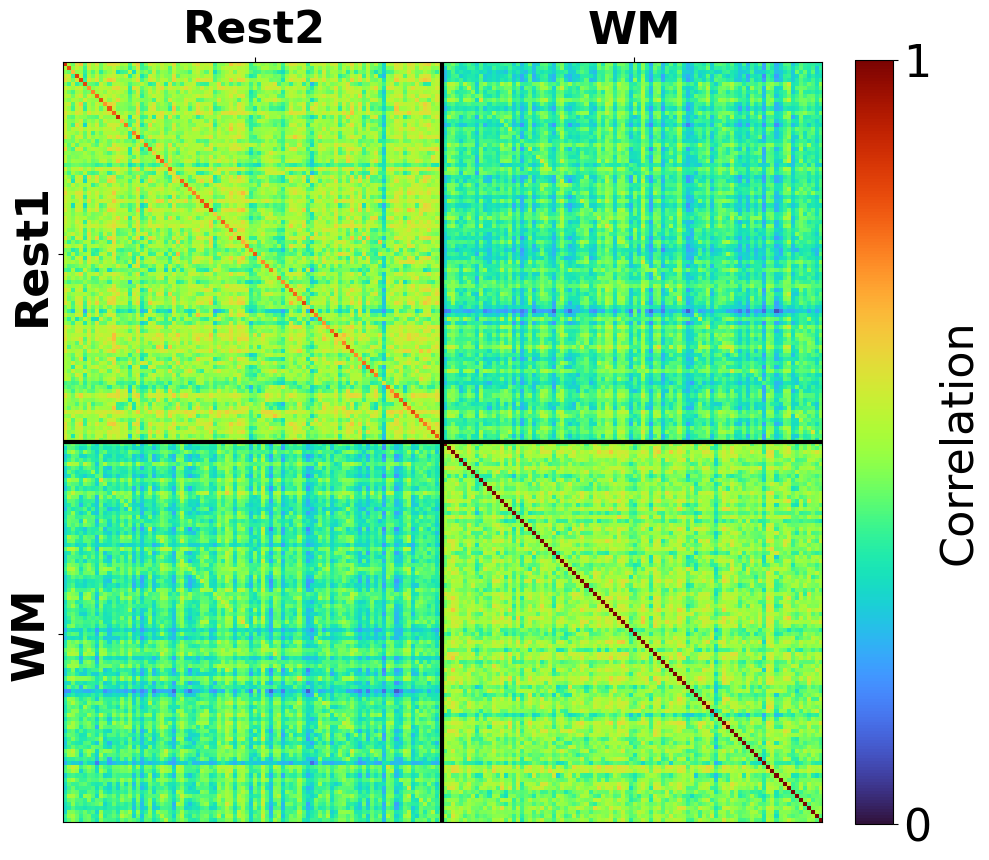

In [92]:
# Stack into a 188x188 matrix
top = np.hstack([rest1_rest2_corrs, rest1_wm_corrs])
bottom = np.hstack([rest2_wm_corrs, wm_wm_corrs])
combined = np.vstack([top, bottom])

# Create the plot
plt.figure(figsize=(10, 10))
im = plt.imshow(combined, cmap='turbo', vmin=0, vmax=1)

# Add quadrant dividers
plt.axvline(94 - 0.5, color='black', linewidth=3)
plt.axhline(94 - 0.5, color='black', linewidth=3)

# Add axis ticks roughly centered on each block
plt.xticks([47, 141], ['Rest2', 'WM'], fontsize=32, fontweight='bold')
plt.gca().xaxis.set_ticks_position('top')     # move ticks to top
plt.yticks([47, 141], ['Rest1', 'WM'], fontsize=32, rotation=90, fontweight='bold', va='center', ha='right')

# Add axis labels
# plt.xlabel("Target Subject Set", fontsize=14)
# plt.ylabel("Query Subject Set", fontsize=14)

# Add colorbar
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label('Correlation', fontsize=32)
cbar.ax.tick_params(labelsize=32)
cbar.set_ticks([0.0, 1.0])
cbar.ax.set_yticklabels(['0', '1'])

# Add title
# plt.title("Combined Subject-Wise Correlation Matrix", fontsize=14)

plt.tight_layout()
plt.show()

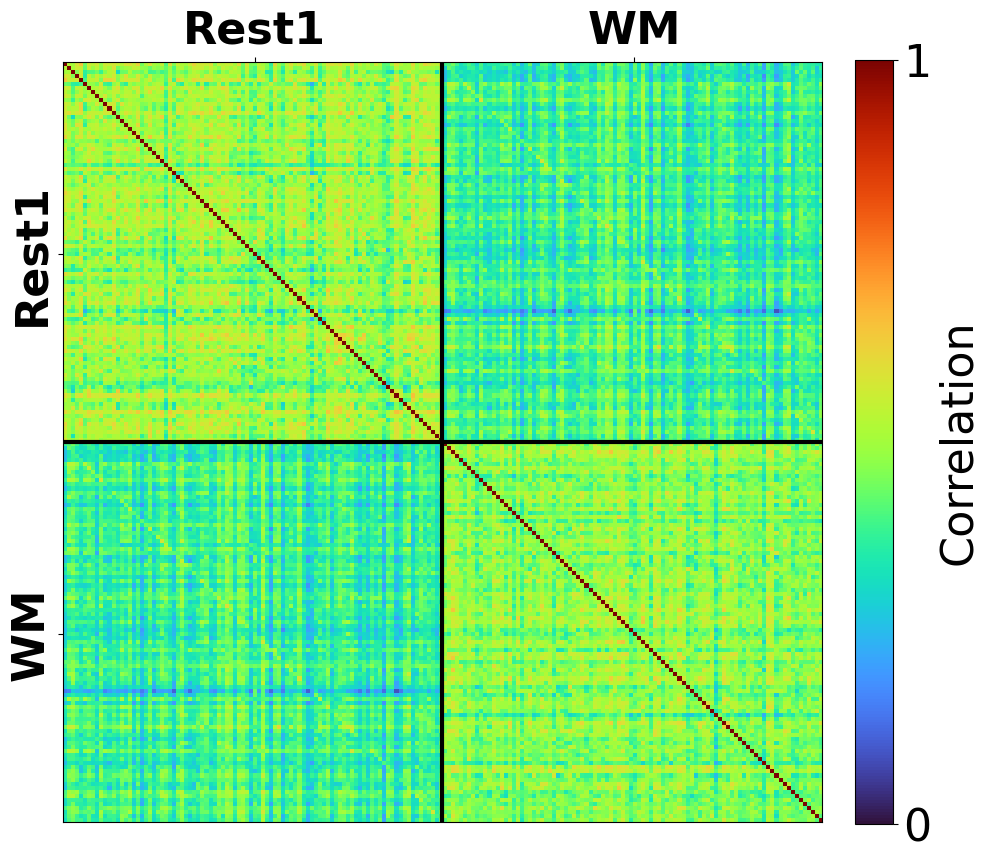

In [91]:
# Stack into a 188x188 matrix
top = np.hstack([rest1_rest1_corrs, rest1_wm_corrs])
bottom = np.hstack([rest1_wm_corrs, wm_wm_corrs])
combined = np.vstack([top, bottom])

# Create the plot
plt.figure(figsize=(10, 10))
im = plt.imshow(combined, cmap='turbo', vmin=0, vmax=1)

# Add quadrant dividers
plt.axvline(94 - 0.5, color='black', linewidth=3)
plt.axhline(94 - 0.5, color='black', linewidth=3)

# Add axis ticks roughly centered on each block
plt.xticks([47, 141], ['Rest1', 'WM'], fontsize=32, fontweight='bold')
plt.gca().xaxis.set_ticks_position('top')     # move ticks to top
plt.yticks([47, 141], ['Rest1', 'WM'], fontsize=32, rotation=90, fontweight='bold', va='center', ha='right')

# Add axis labels
# plt.xlabel("Target Subject Set", fontsize=14)
# plt.ylabel("Query Subject Set", fontsize=14)

# Add colorbar
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label('Correlation', fontsize=32)
cbar.ax.tick_params(labelsize=32)
cbar.set_ticks([0.0, 1.0])
cbar.ax.set_yticklabels(['0', '1'])

# Add title
# plt.title("Combined Subject-Wise Correlation Matrix", fontsize=14)

plt.tight_layout()
plt.show()

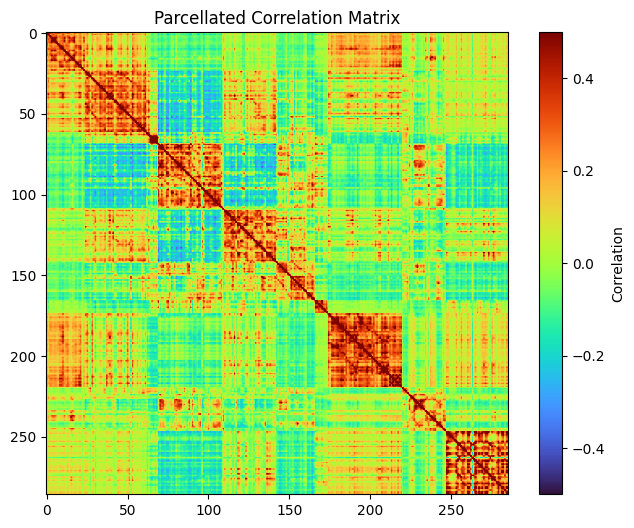

In [67]:
pconns_hcp = sio.loadmat("./data/hcp/HCP_unrelated94.mat")
pconns_rest1 = np.transpose(np.tanh(pconns_hcp["zmat1"]), (2, 0, 1))
pconns_rest2 = np.transpose(np.tanh(pconns_hcp["zmat2"]), (2, 0, 1))

indices = np.ix_(np.arange(pconns_rest1.shape[0]), parcel_order, parcel_order)
pconns_rest1, pconns_rest2 = pconns_rest1[indices], pconns_rest2[indices] # reorder
pconns_rest1, pconns_rest2 = pconns_rest1[:, keepnets, :][:, :, keepnets], pconns_rest2[:, keepnets, :][:, :, keepnets]
pconns_wm = 1.0 - profile_dist_mats_wm

plt.figure(figsize=(8, 6))
plt.imshow(np.mean(pconns_rest1, axis=0), cmap='turbo', vmin=-0.5, vmax=0.5)
plt.colorbar(label='Correlation')
plt.title('Parcellated Correlation Matrix')
plt.show()

In [112]:
rest1_rest1_corrs_ori = compute_subjectwise_pconn_correlation(pconns_rest1, pconns_rest1)
rest1_rest2_corrs_ori = compute_subjectwise_pconn_correlation(pconns_rest1, pconns_rest2)
rest1_wm_corrs_ori = compute_subjectwise_pconn_correlation(pconns_rest1, pconns_wm)
rest2_wm_corrs_ori = compute_subjectwise_pconn_correlation(pconns_rest2, pconns_wm)
wm_wm_corrs_ori = compute_subjectwise_pconn_correlation(pconns_wm, pconns_wm)

sio.savemat('./results/parcel_corrs.mat', {'rest1_rest1_corrs': rest1_rest1_corrs_ori, 'rest1_rest2_corrs': rest1_rest2_corrs_ori, 
                                            'rest1_wm_corrs': rest1_wm_corrs_ori, 'rest2_wm_corrs': rest2_wm_corrs_ori, 'wm_wm_corrs': wm_wm_corrs_ori})

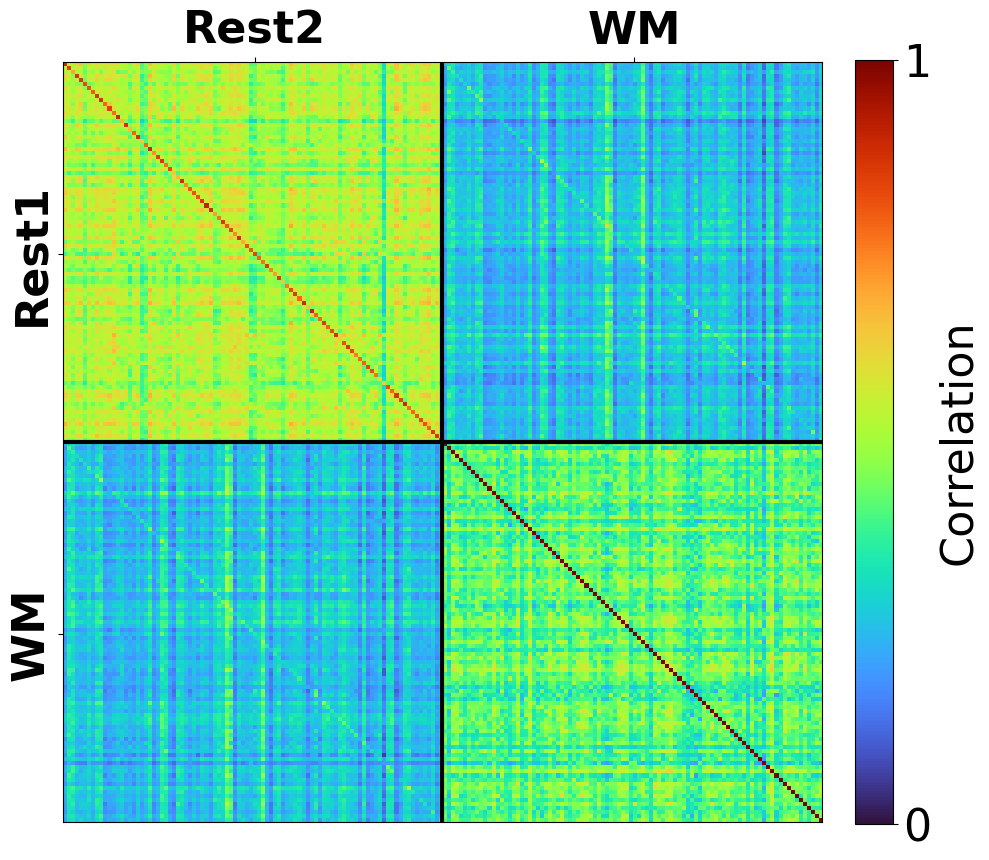

In [93]:
# Stack into a 188x188 matrix
top = np.hstack([rest1_rest2_corrs_ori, rest1_wm_corrs_ori])
bottom = np.hstack([rest2_wm_corrs_ori, wm_wm_corrs_ori])
combined = np.vstack([top, bottom])

# Create the plot
plt.figure(figsize=(10, 10))
im = plt.imshow(combined, cmap='turbo', vmin=0, vmax=1)

# Add quadrant dividers
plt.axvline(94 - 0.5, color='black', linewidth=3)
plt.axhline(94 - 0.5, color='black', linewidth=3)

# Add axis ticks roughly centered on each block
plt.xticks([47, 141], ['Rest2', 'WM'], fontsize=32, fontweight='bold')
plt.gca().xaxis.set_ticks_position('top')     # move ticks to top
plt.yticks([47, 141], ['Rest1', 'WM'], fontsize=32, rotation=90, fontweight='bold', va='center', ha='right')
, 
# Add axis labels
# plt.xlabel("Target Subject Set", fontsize=14)
# plt.ylabel("Query Subject Set", fontsize=14)

# Add colorbar
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label('Correlation', fontsize=32)
cbar.ax.tick_params(labelsize=32)
cbar.set_ticks([0.0, 1.0])
cbar.ax.set_yticklabels(['0', '1'])

# Add title
# plt.title("Combined Subject-Wise Correlation Matrix", fontsize=14)

plt.tight_layout()
plt.show()


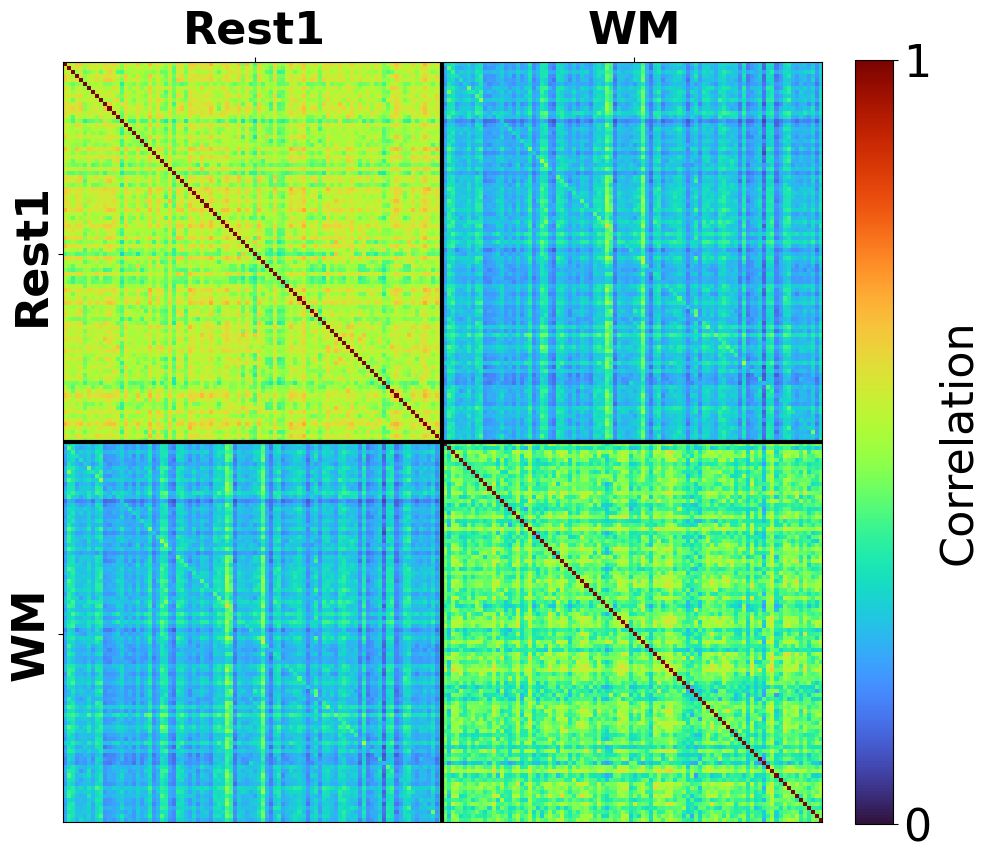

In [94]:
# Stack into a 188x188 matrix
top = np.hstack([rest1_rest1_corrs_ori, rest1_wm_corrs_ori])
bottom = np.hstack([rest1_wm_corrs_ori, wm_wm_corrs_ori])
combined = np.vstack([top, bottom])

# Create the plot
plt.figure(figsize=(10, 10))
im = plt.imshow(combined, cmap='turbo', vmin=0, vmax=1)

# Add quadrant dividers
plt.axvline(94 - 0.5, color='black', linewidth=3)
plt.axhline(94 - 0.5, color='black', linewidth=3)

# Add axis ticks roughly centered on each block
plt.xticks([47, 141], ['Rest1', 'WM'], fontsize=32, fontweight='bold')
plt.gca().xaxis.set_ticks_position('top')     # move ticks to top
plt.yticks([47, 141], ['Rest1', 'WM'], fontsize=32, rotation=90, fontweight='bold', va='center', ha='right')

# Add axis labels
# plt.xlabel("Target Subject Set", fontsize=14)
# plt.ylabel("Query Subject Set", fontsize=14)

# Add colorbar
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label('Correlation', fontsize=32)
cbar.ax.tick_params(labelsize=32)
cbar.set_ticks([0.0, 1.0])
cbar.ax.set_yticklabels(['0', '1'])

# Add title
# plt.title("Combined Subject-Wise Correlation Matrix", fontsize=14)

plt.tight_layout()
plt.show()

In [104]:
rest1_rest1_mean_parcel, rest1_rest1_std_parcel = upper_triangle_stats(rest1_rest1_corrs_ori)
wm_wm_mean_parcel, wm_wm_std_parcel = upper_triangle_stats(wm_wm_corrs_ori)
rest1_wm_mean_parcel, rest1_wm_std_parcel = upper_triangle_stats(rest1_wm_corrs_ori)

print(rest1_rest1_mean_parcel)
print(rest1_rest1_std_parcel)
print(wm_wm_mean_parcel)
print(wm_wm_std_parcel)
print(rest1_wm_mean_parcel)
print(rest1_wm_std_parcel)

0.5209676548370853
0.06058036280911638
0.41558698264387905
0.06851081196789202
0.263667408536637
0.06222721491926468


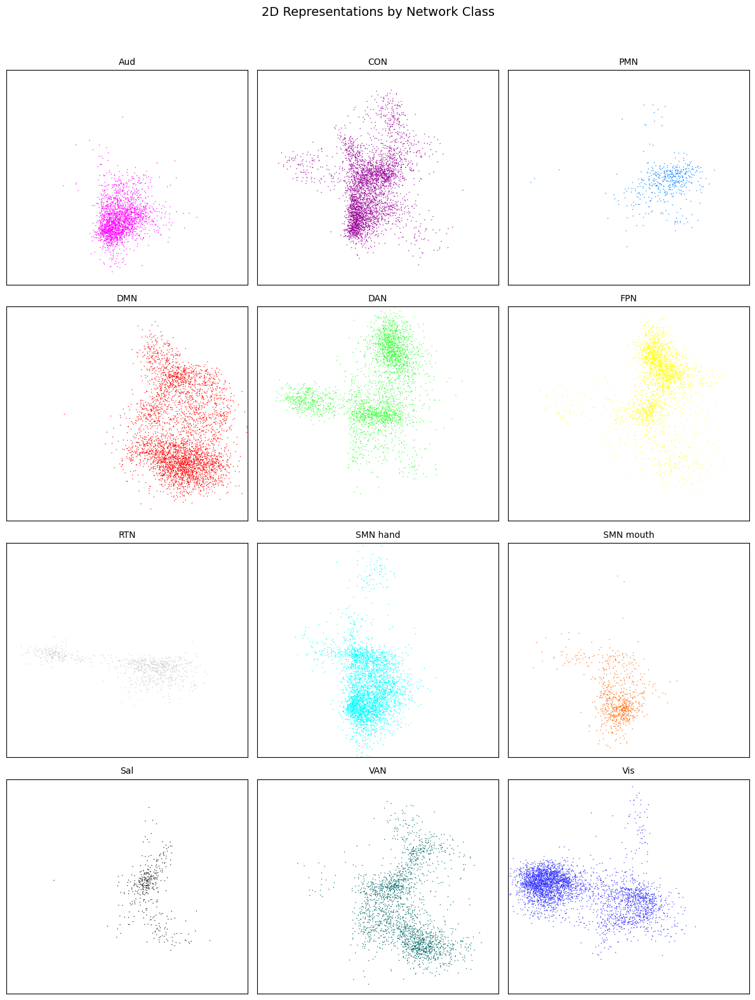

In [70]:
visualize_representations_subplots(mus_wm, labels_wm, net_names, net_colors, s=1, alpha=1)

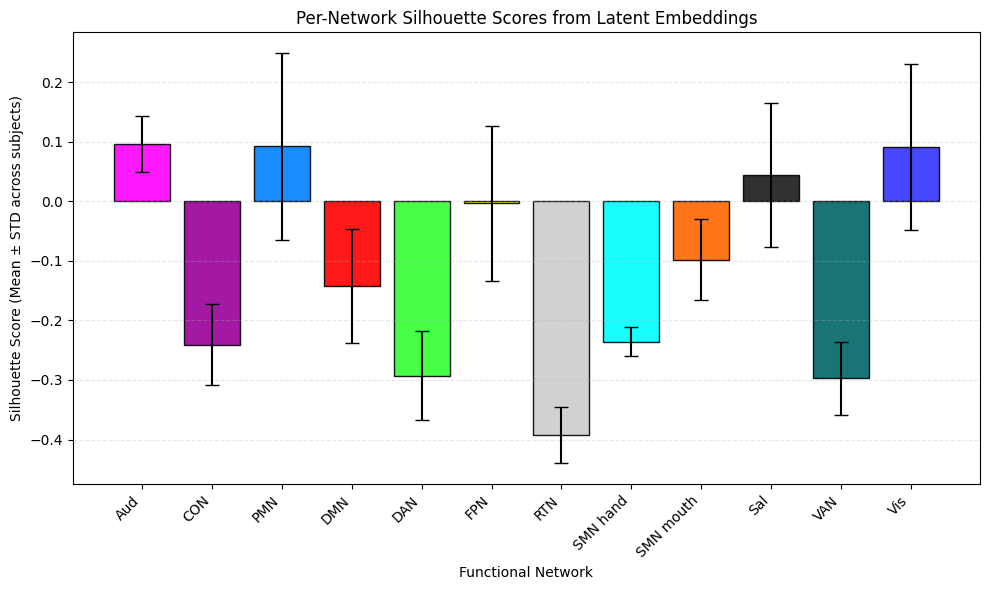

In [39]:
plot_silhouette_per_class(mus_wm, labels_wm, subj_indices_wm, net_names, net_colors)

### Fingerprinting classification

In [98]:
X_rest1_parcel = pconns_rest1[:, triu_indices[0], triu_indices[1]]
X_wm_parcel = pconns_wm[:, triu_indices[0], triu_indices[1]]

X_rest1_latent = vae_latents.transpose(1, 0, 2).reshape(n_hcp_subjects, -1)
X_wm_latent = mus_reshaped_wm.transpose(1, 0, 2).reshape(n_hcp_subjects, -1)

X_parcel = np.vstack([X_rest1_parcel, X_wm_parcel])  # (188, n_features)
X_latent = np.vstack([X_rest1_latent, X_wm_latent])
y = np.array([0]*n_hcp_subjects + [1]*n_hcp_subjects)    # 0 = rest, 1 = task


In [100]:
def cross_val_svm_with_confusion(X, y, n_folds=5, C=1, kernel='linear', random_state=42):
    """
    Perform cross-validated SVM classification and return mean accuracy and confusion matrix.

    Parameters
    ----------
    X : np.ndarray of shape (n_samples, n_features)
        Input feature matrix.
    
    y : np.ndarray of shape (n_samples,)
        Binary class labels (0/1 or other integers).
    
    n_folds : int
        Number of cross-validation folds (default: 5)
    
    C : float
        SVM regularization parameter (default: 1)
    
    kernel : str
        Kernel type to use in SVC (default: 'linear')
    
    random_state : int
        Seed for reproducibility in StratifiedKFold (default: 42)

    Returns
    -------
    mean_accuracy : float
        Mean classification accuracy across folds.

    conf_matrix : np.ndarray of shape (n_classes, n_classes)
        Aggregated confusion matrix across all folds.
    """
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=random_state)
    scaler = StandardScaler()
    clf = SVC(C=C, kernel=kernel, random_state=random_state)

    all_preds = []
    all_true = []

    for train_idx, test_idx in cv.split(X, y):
        print("Processing another fold... ")

        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Scale features
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Fit and predict
        clf.fit(X_train_scaled, y_train)
        y_pred = clf.predict(X_test_scaled)

        all_preds.extend(y_pred)
        all_true.extend(y_test)

    # Aggregate results
    mean_accuracy = accuracy_score(all_true, all_preds)
    conf_matrix = confusion_matrix(all_true, all_preds)

    return mean_accuracy, conf_matrix


In [124]:
acc_latent, confusion_mat_latent = cross_val_svm_with_confusion(X_latent, y, n_folds=10)
acc_parcel, confusion_mat_parcel = cross_val_svm_with_confusion(X_parcel, y, n_folds=10)

print(confusion_mat_latent)

Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
Processing another fold... 
[[94  0]
 [ 0 94]]


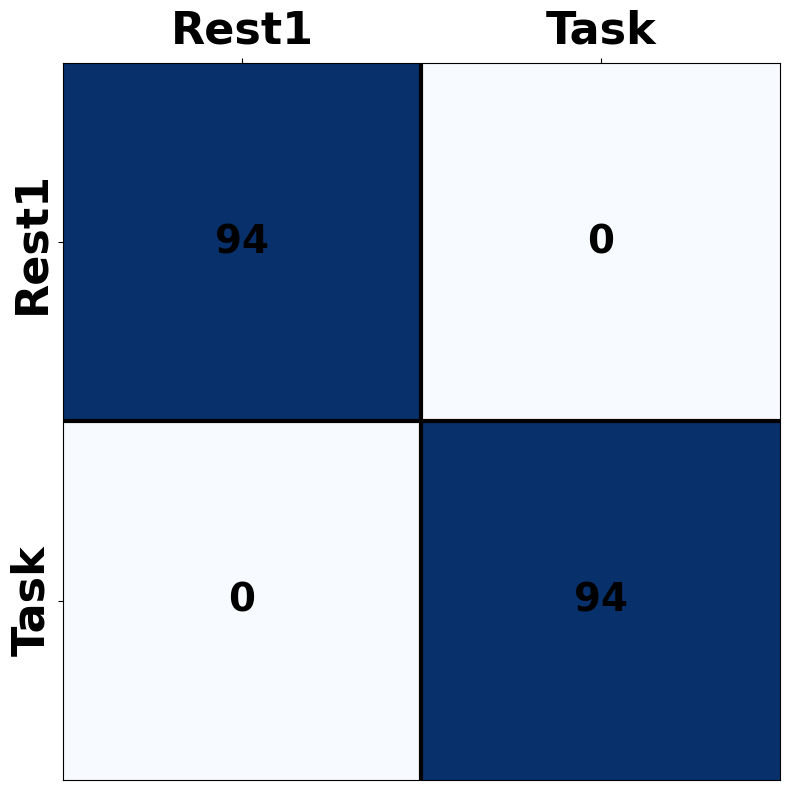

In [125]:
plt.figure(figsize=(8, 8))

# Plot confusion matrix
im = plt.imshow(confusion_mat_latent, cmap='Blues', vmin=0, vmax=confusion_mat_latent.max())

# Add text annotations
for i in range(confusion_mat_latent.shape[0]):
    for j in range(confusion_mat_latent.shape[1]):
        plt.text(j, i, str(confusion_mat_latent[i, j]),
                 ha='center', va='center',
                 fontsize=28, fontweight='bold', color='black')

# Axis ticks
plt.xticks([0, 1], ['Rest1', 'Task'], fontsize=32, fontweight='bold')
plt.yticks([0, 1], ['Rest1', 'Task'], fontsize=32, fontweight='bold', rotation=90, va='center', ha='right')

# Move x-ticks to top
plt.gca().xaxis.set_ticks_position('top')
plt.gca().xaxis.set_label_position('top')

# Add dividing lines
plt.axvline(0.5, color='black', linewidth=3)
plt.axhline(0.5, color='black', linewidth=3)

# Add colorbar
# cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
# cbar.set_label('Count', fontsize=32)
# cbar.ax.tick_params(labelsize=32)
# cbar.set_ticks([0, confusion_mat_latent.max()])
# cbar.ax.set_yticklabels(['0', str(confusion_mat_latent.max())])

plt.tight_layout()
plt.show()

### Age/ sex/ CogFluid predictions

In [176]:
from scipy.stats import ttest_ind
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from scipy.stats import zscore
from sklearn.model_selection import KFold

def fisher_z_transform(X):
    """
    Apply Fisher z-transformation to each element in X (excluding �1 to avoid infinities).
    """
    X = np.clip(X, -0.999999, 0.999999)
    return 0.5 * np.log((1 + X) / (1 - X))


def predict_gf_finn_style(X, y, p_thresh=0.01, tail='positive'):
    """
    Re-implementation of Finn et al. (2015) fluid intelligence prediction using LOOCV.

    Parameters
    ----------
    X : ndarray of shape (n_subjects, n_features)
        Input features (e.g., flattened Fisher-z correlation edges).

    y : ndarray of shape (n_subjects,)
        Target vector (e.g., fluid intelligence scores).

    p_thresh : float
        P-value threshold for feature selection via Pearson correlation.

    tail : str
        Which feature tail to use:
        - 'positive': use positively correlated features only
        - 'negative': use negatively correlated features only
        - 'both': use both tails (combine)

    Returns
    -------
    results : dict
        Dictionary with predicted values, actual values, correlation r, and p-value.
    """
    n_subjects = X.shape[0]
    y_pred = np.zeros(n_subjects)

    for i in range(n_subjects):
        print(f"Processing subject {i+1}... ")

        # Split into train/test
        X_train = np.delete(X, i, axis=0)
        y_train = np.delete(y, i)
        X_test = X[i]

        # Feature selection: correlate each feature with y_train
        r_vals = np.array([pearsonr(X_train[:, j], y_train)[0] for j in range(X.shape[1])])
        p_vals = np.array([pearsonr(X_train[:, j], y_train)[1] for j in range(X.shape[1])])

        if tail == 'positive':
            selected = (r_vals > 0) & (p_vals < p_thresh)
        elif tail == 'negative':
            selected = (r_vals < 0) & (p_vals < p_thresh)
        elif tail == 'both':
            selected = p_vals < p_thresh
        else:
            raise ValueError("tail must be 'positive', 'negative', or 'both'")

        if np.sum(selected) == 0:
            raise ValueError(f"No features passed selection at p < {p_thresh}")

        # Compute summary scores: mean strength of selected features
        X_train_sum = X_train[:, selected].mean(axis=1)
        X_test_sum = X_test[selected].mean()

        # Fit univariate regression
        model = LinearRegression()
        model.fit(X_train_sum.reshape(-1, 1), y_train)
        y_pred[i] = model.predict([[X_test_sum]])

    # Correlate predictions with actual values
    r, p = pearsonr(y_pred, y)

    return {
        'y_pred': y_pred,
        'y_true': y,
        'r': r,
        'p_value': p,
    }



def predict_gf_finn_style_kfold(X, y, p_thresh=0.01, tail='positive', n_splits=10):
    """
    Re-implementation of Finn et al. (2015) fluid intelligence prediction using k-fold CV.

    Parameters
    ----------
    X : ndarray of shape (n_subjects, n_features)
        Input features (e.g., flattened Fisher-z correlation edges).

    y : ndarray of shape (n_subjects,)
        Target vector (e.g., fluid intelligence scores).

    p_thresh : float
        P-value threshold for feature selection via Pearson correlation.

    tail : str
        Which feature tail to use:
        - 'positive': use positively correlated features only
        - 'negative': use negatively correlated features only
        - 'both': use both tails (combine)

    n_splits : int
        Number of folds for cross-validation (default = 10)

    Returns
    -------
    results : dict
        Dictionary with predicted values, actual values, correlation r, and p-value.
    """
    n_subjects = X.shape[0]
    y_pred = np.zeros(n_subjects)

    # Define cross-validation folds
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    for fold_idx, (train_idx, test_idx) in enumerate(kf.split(X)):
        print(f"Processing fold {fold_idx + 1}...")

        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Feature selection: correlate each feature with y_train
        r_vals = np.array([pearsonr(X_train[:, j], y_train)[0] for j in range(X.shape[1])])
        p_vals = np.array([pearsonr(X_train[:, j], y_train)[1] for j in range(X.shape[1])])

        if tail == 'positive':
            selected = (r_vals > 0) & (p_vals < p_thresh)
        elif tail == 'negative':
            selected = (r_vals < 0) & (p_vals < p_thresh)
        elif tail == 'both':
            selected = p_vals < p_thresh
        else:
            raise ValueError("tail must be 'positive', 'negative', or 'both'")

        if np.sum(selected) == 0:
            raise ValueError(f"No features passed selection at p < {p_thresh} in fold {fold_idx + 1}")

        # Summary score: mean of selected features
        X_train_sum = X_train[:, selected].mean(axis=1).reshape(-1, 1)
        X_test_sum = X_test[:, selected].mean(axis=1).reshape(-1, 1)

        # Train and predict
        model = LinearRegression()
        model.fit(X_train_sum, y_train)
        y_pred[test_idx] = model.predict(X_test_sum)

    # Evaluate performance
    r, p = pearsonr(y_pred, y)

    return {
        'y_pred': y_pred,
        'y_true': y,
        'r': r,
        'p_value': p
    }



def predict_from_latent_embeddings(X, y, 
                                    apply_zscore=False, 
                                    estimator_type='linear', 
                                    alpha=1.0):
    """
    Predict target values from latent embeddings using LOOCV and linear/ridge/lasso regression.

    Parameters
    ----------
    X : ndarray of shape (n_samples, n_features)
        Latent feature matrix (e.g., from dimensionality reduction).

    y : ndarray of shape (n_samples,)
        Target values (e.g., fluid intelligence).

    apply_zscore : bool
        Whether to z-score the input features across samples.

    estimator_type : str
        Regression model to use:
        - 'linear' : LinearRegression
        - 'ridge'  : Ridge regression (L2)
        - 'lasso'  : Lasso regression (L1)

    alpha : float
        Regularization strength for ridge or lasso.

    Returns
    -------
    results : dict
        Dictionary containing predicted values, true values, Pearson r and p-value.
    """
    n_samples = X.shape[0]
    y_pred = np.zeros(n_samples)

    # Optional z-score normalization (column-wise)
    X_proc = zscore(X, axis=0) if apply_zscore else X.copy()

    for i in range(n_samples):
        # Split train/test
        X_train = np.delete(X_proc, i, axis=0)
        y_train = np.delete(y, i)
        X_test = X_proc[i].reshape(1, -1)

        # Choose model
        if estimator_type == 'linear':
            model = LinearRegression()
        elif estimator_type == 'ridge':
            model = Ridge(alpha=alpha)
        elif estimator_type == 'lasso':
            model = Lasso(alpha=alpha, max_iter=10000)
        else:
            raise ValueError(f"Invalid estimator_type: {estimator_type}")

        # Train and predict
        model.fit(X_train, y_train)
        y_pred[i] = model.predict(X_test)[0]

    # Evaluate correlation
    r, p = pearsonr(y_pred, y)

    return {
        'y_pred': y_pred,
        'y_true': y,
        'r': r,
        'p_value': p
    }



In [177]:
behavior_df = pd.read_csv("/data/wheelock/data1/datasets/HCP/HCP_Behavior_Tu_downloaded.csv")
behavior_df['Subject'] = behavior_df['Subject'].astype(str)
filtered_df = behavior_df[behavior_df['Subject'].isin(hcp_subjects)].set_index('Subject')
filtered_df = filtered_df.loc[hcp_subjects]
df = filtered_df[['Age', 'Gender', 'CogFluidComp_Unadj', 'CogFluidComp_AgeAdj']]

print(df)
print(hcp_subjects)

           Age Gender  CogFluidComp_Unadj  CogFluidComp_AgeAdj
Subject                                                       
100307   26-30      F              118.16               107.88
100408   31-35      M              116.64               113.77
101107   22-25      M              117.37               106.57
101309   26-30      M              107.14                90.01
101915   31-35      F              101.27                87.99
...        ...    ...                 ...                  ...
756055   22-25      M              101.75                81.36
792564   31-35      F              112.60               106.90
856766   31-35      F              112.27               106.23
857263   22-25      M               96.34                73.77
899885   26-30      F              119.47               109.74

[94 rows x 4 columns]
['100307', '100408', '101107', '101309', '101915', '103111', '103414', '103818', '105014', '105115', '106016', '108828', '110411', '111312', '111716', '113619

In [178]:
cogFluidComp_unadj = df['CogFluidComp_Unadj'].astype(float).to_numpy()

In [179]:
fluid_results_parcel = predict_gf_finn_style(fisher_z_transform(X_rest1_parcel), cogFluidComp_unadj, p_thresh=0.01, tail='positive')
fluid_results_latent = predict_gf_finn_style(X_rest1_latent, cogFluidComp_unadj, p_thresh=0.01, tail='positive')

print(fluid_results_parcel['r'])
print(fluid_results_parcel['p_value'])
print(fluid_results_latent['r'])
print(fluid_results_latent['p_value'])

Processing subject 1... 
Processing subject 2... 
Processing subject 3... 
Processing subject 4... 
Processing subject 5... 
Processing subject 6... 
Processing subject 7... 
Processing subject 8... 
Processing subject 9... 
Processing subject 10... 
Processing subject 11... 
Processing subject 12... 
Processing subject 13... 
Processing subject 14... 
Processing subject 15... 
Processing subject 16... 
Processing subject 17... 
Processing subject 18... 
Processing subject 19... 
Processing subject 20... 
Processing subject 21... 
Processing subject 22... 
Processing subject 23... 
Processing subject 24... 
Processing subject 25... 
Processing subject 26... 
Processing subject 27... 
Processing subject 28... 
Processing subject 29... 
Processing subject 30... 
Processing subject 31... 
Processing subject 32... 
Processing subject 33... 
Processing subject 34... 
Processing subject 35... 
Processing subject 36... 
Processing subject 37... 
Processing subject 38... 
Processing subject 39

In [180]:
print(fluid_results_parcel)

{'y_pred': array([120.77126896, 112.11467414, 122.61919279, 113.9210642 ,
       110.06327095, 116.97455671, 111.45671655, 115.40709502,
       112.50590562, 117.31749349, 103.19461   , 111.22597685,
       125.18194285, 114.40857114, 107.84453053, 105.84309695,
       112.53916865, 113.2686187 , 112.9141186 , 112.61861441,
       114.84986466, 117.11797019, 115.27802721, 115.90829451,
       118.39261033, 117.79270646, 117.80477187, 109.89472543,
       112.1630453 , 115.03623609, 115.71712878, 112.72047407,
       116.81251439, 101.2761678 , 105.89571853, 120.5315717 ,
       125.1527709 , 109.18431619, 115.48145928, 120.06589708,
       112.91303852, 120.68919809, 118.02695955, 116.52979309,
       110.79500162, 118.93187155,  99.94147546, 129.11516663,
       112.75668158, 118.20946776, 106.35543643, 113.59092779,
       122.14637027, 113.25411463, 110.37772011, 110.99496473,
       117.75651071, 114.20807961, 112.03699282, 115.31886851,
       111.73514449, 118.87178675, 107.74930

In [175]:
fluid_results_latent_m = predict_from_latent_embeddings(X_rest1_latent, cogFluidComp_unadj, apply_zscore=False, estimator_type='linear', alpha=0.2)
print(fluid_results_latent_m)
print(fluid_results_latent_m['r'])
print(fluid_results_latent_m['p_value'])

{'y_pred': array([122.21252441, 116.90693665, 117.0203476 , 106.10907745,
       111.51737976, 120.45881653, 122.60664368, 107.54008484,
       119.7420578 , 110.34806824, 102.29167175, 110.86501312,
       125.46078491,  98.99590302, 125.2450943 , 118.58230591,
       110.74832916, 114.63877869, 115.88117981, 118.50361633,
       108.27903748, 110.07460785, 105.26078796, 122.03166199,
       114.72814178,  97.24390411, 125.33002472, 106.18002319,
        96.59034729, 128.33259583, 116.2575531 , 114.92360687,
       122.37290955, 109.96401978, 107.33371735, 120.35403442,
       117.20797729, 103.94630432, 109.5438385 , 121.43457031,
       101.31525421, 122.33821869, 113.26876831, 110.24681854,
       111.5765686 , 124.86733246, 100.82787323, 115.78050995,
       120.65901947, 119.29541016, 102.73162079, 110.87228394,
       114.62944794, 103.09790039, 112.00882721, 120.34298706,
       107.46147919, 114.82182312, 123.53787231, 117.49490356,
       108.26935577, 110.9325943 , 108.43395